# **Food/Fruit Recognition and Calorie Estimation**
## **Part A Food or Fruit Classification**

## **Importing necessary libraries**

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from matplotlib.gridspec import GridSpec
from scipy import ndimage
from sklearn.decomposition import PCA
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


## **CONFIGURATION**

In [ ]:
PROJECT_DATA_PATH = '/kaggle/input/datasets-cv/Project Data'
FOOD_PATH = os.path.join(PROJECT_DATA_PATH, 'Food')
FRUIT_PATH = os.path.join(PROJECT_DATA_PATH, 'Fruit')
FOOD_TRAIN_PATH = os.path.join(FOOD_PATH, 'Train')
FOOD_VAL_PATH = os.path.join(FOOD_PATH, 'Validation')
FRUIT_TRAIN_PATH = os.path.join(FRUIT_PATH, 'Train')
FRUIT_VAL_PATH = os.path.join(FRUIT_PATH, 'Validation')

## **Custom CNN**

In [ ]:
# ==========================================
# 1. CONFIGURATION & PATHS
# ==========================================
PROJECT_DATA_PATH = '/kaggle/input/datasets-cv/Project Data'
FOOD_PATH = os.path.join(PROJECT_DATA_PATH, 'Food')
FRUIT_PATH = os.path.join(PROJECT_DATA_PATH, 'Fruit')
FOOD_TRAIN_PATH = os.path.join(FOOD_PATH, 'Train')
FOOD_VAL_PATH = os.path.join(FOOD_PATH, 'Validation')
FRUIT_TRAIN_PATH = os.path.join(FRUIT_PATH, 'Train')
FRUIT_VAL_PATH = os.path.join(FRUIT_PATH, 'Validation')

IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 30
LEARNING_RATE = 0.001

LABEL_MAPPING = {'Food': 0, 'Fruit': 1}

print("=" * 70)
print("PART A: FOOD vs FRUIT - CUSTOM RESIDUAL CNN (Training from Scratch)")
print("=" * 70)

# ==========================================
# 2. DATA LOADING FUNCTIONS
# ==========================================
def load_food_images(data_path, max_images_per_category=None):
    images = []
    labels = []
    categories = sorted(os.listdir(data_path))
    for category in categories:
        category_path = os.path.join(data_path, category)
        if not os.path.isdir(category_path): continue
        image_files = sorted(os.listdir(category_path))
        if max_images_per_category: image_files = image_files[:max_images_per_category]
        for img_file in image_files:
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(category_path, img_file)
                try:
                    img = cv2.imread(img_path)
                    if img is None: continue
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                    images.append(img)
                    labels.append('Food')
                except Exception as e:
                    print(f"Error loading {img_path}: {e}")
    return images, labels

def load_fruit_images(data_path, max_images_per_category=None):
    images = []
    labels = []
    categories = sorted(os.listdir(data_path))
    for category in categories:
        images_path = os.path.join(data_path, category, 'Images')
        if not os.path.exists(images_path): continue
        image_files = sorted(os.listdir(images_path))
        if max_images_per_category: image_files = image_files[:max_images_per_category]
        for img_file in image_files:
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(images_path, img_file)
                try:
                    img = cv2.imread(img_path)
                    if img is None: continue
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                    images.append(img)
                    labels.append('Fruit')
                except Exception as e:
                    print(f"Error loading {img_path}: {e}")
    return images, labels

PART A: FOOD vs FRUIT - CUSTOM RESIDUAL CNN (Training from Scratch)


In [ ]:
# ==========================================
# 3. LOAD & PREPARE DATA
# ==========================================
print("\n📂 Loading Training Data...")
print("-" * 70)
food_train_images, food_train_labels = load_food_images(FOOD_TRAIN_PATH)
fruit_train_images, fruit_train_labels = load_fruit_images(FRUIT_TRAIN_PATH)
train_images = food_train_images + fruit_train_images
train_labels = food_train_labels + fruit_train_labels

X_train = np.array(train_images, dtype=np.uint8)
y_train = np.array([LABEL_MAPPING[label] for label in train_labels])

print(f"✅ Loaded {len(X_train)} Training images")

print("\n📂 Loading Validation Data...")
print("-" * 70)
food_val_images, food_val_labels = load_food_images(FOOD_VAL_PATH)
fruit_val_images, fruit_val_labels = load_fruit_images(FRUIT_VAL_PATH)
val_images = food_val_images + fruit_val_images
val_labels = food_val_labels + fruit_val_labels

X_val = np.array(val_images, dtype=np.uint8)
y_val = np.array([LABEL_MAPPING[label] for label in val_labels])

print(f"✅ Loaded {len(X_val)} Validation images")

# ==========================================
# 4. DATASET & TRANSFORMS
# ==========================================
class FoodFruitDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform
    def __len__(self): return len(self.images)
    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        if self.transform: image = self.transform(image)
        return image, label

train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(20),
    transforms.RandomHorizontalFlip(),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = FoodFruitDataset(X_train, y_train, transform=train_transform)
val_dataset = FoodFruitDataset(X_val, y_val, transform=val_transform)

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights = torch.FloatTensor(class_weights).to(device)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


📂 Loading Training Data...
----------------------------------------------------------------------
✅ Loaded 4297 Training images

📂 Loading Validation Data...
----------------------------------------------------------------------
✅ Loaded 411 Validation images


In [ ]:
# ==========================================
# 5. CUSTOM RESNET ARCHITECTURE 🛠️
# ==========================================

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()
        # First Conv Layer
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

        # Second Conv Layer
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)

        # Shortcut Connection (Skip Connection)
        self.shortcut = nn.Sequential()
        # If dimensions change (stride != 1) or channels change, we need to adjust the shortcut x
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))

        # Add the shortcut (Residual Connection)
        out += self.shortcut(x)
        out = self.relu(out)
        return out

In [ ]:
# Define the Full Custom Network
class CustomResNet(nn.Module):
    def __init__(self, num_classes=2):
        super(CustomResNet, self).__init__()

        # Initial Layers (Stem)
        self.in_channels = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Residual Layers
        # Layer 1: 64 channels
        self.layer1 = self._make_layer(64, 2, stride=1)
        # Layer 2: 128 channels
        self.layer2 = self._make_layer(128, 2, stride=2)
        # Layer 3: 256 channels
        self.layer3 = self._make_layer(256, 2, stride=2)

        # Classifier Head
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(256, num_classes)

    def _make_layer(self, out_channels, blocks, stride):
        layers = []
        # First block handles stride (downsampling)
        layers.append(ResidualBlock(self.in_channels, out_channels, stride))
        self.in_channels = out_channels
        # Subsequent blocks keep same dimensions
        for _ in range(1, blocks):
            layers.append(ResidualBlock(out_channels, out_channels, stride=1))
        return nn.Sequential(*layers)

    def forward(self, x):
        # Stem
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        # Layers
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)

        # Classifier
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)
        return x


In [ ]:
# Initialize Custom Model
model = CustomResNet(num_classes=2)
model = model.to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=4, verbose=True)

print("\n🏗️ Custom Model Architecture:")
print("-" * 70)
total_params = sum(p.numel() for p in model.parameters())
print(f"✅ Total Parameters: {total_params:,}")

os.makedirs('models', exist_ok=True)


🏗️ Custom Model Architecture:
----------------------------------------------------------------------
✅ Total Parameters: 2,783,298


In [ ]:
# ==========================================
# 6. TRAINING LOOP (MODIFIED)
# ==========================================
import time

history = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': [],
    'train_precision': [], 'train_recall': [],
    'val_precision': [], 'val_recall': [],
    'train_time': [], 'val_time': []  # جديد
}

best_val_acc = 0.0
patience_counter = 0
patience = 10

total_train_time = 0
total_val_time = 0

print("\n🚀 Starting Training...")
print("=" * 70)

for epoch in range(EPOCHS):
    # ===== TRAINING =====
    model.train()
    train_loss = 0.0
    train_correct = 0
    train_total = 0
    train_tp, train_fp, train_fn = 0, 0, 0

    train_start_time = time.time()

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()

        train_tp += ((predicted == 1) & (labels == 1)).sum().item()
        train_fp += ((predicted == 1) & (labels == 0)).sum().item()
        train_fn += ((predicted == 0) & (labels == 1)).sum().item()

    train_epoch_time = time.time() - train_start_time
    total_train_time += train_epoch_time

    train_loss = train_loss / len(train_loader)
    train_acc = train_correct / train_total
    train_precision = train_tp / (train_tp + train_fp) if (train_tp + train_fp) > 0 else 0
    train_recall = train_tp / (train_tp + train_fn) if (train_tp + train_fn) > 0 else 0

    # ===== VALIDATION =====
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    val_tp, val_fp, val_fn = 0, 0, 0

    val_start_time = time.time()

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

            val_tp += ((predicted == 1) & (labels == 1)).sum().item()
            val_fp += ((predicted == 1) & (labels == 0)).sum().item()
            val_fn += ((predicted == 0) & (labels == 1)).sum().item()

    val_epoch_time = time.time() - val_start_time
    total_val_time += val_epoch_time

    val_loss = val_loss / len(val_loader)
    val_acc = val_correct / val_total
    val_precision = val_tp / (val_tp + val_fp) if (val_tp + val_fp) > 0 else 0
    val_recall = val_tp / (val_tp + val_fn) if (val_tp + val_fn) > 0 else 0

    # Store metrics
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['train_precision'].append(train_precision)
    history['train_recall'].append(train_recall)
    history['val_precision'].append(val_precision)
    history['val_recall'].append(val_recall)
    history['train_time'].append(train_epoch_time)
    history['val_time'].append(val_epoch_time)

    scheduler.step(val_loss)

    print(f"Epoch [{epoch+1}/{EPOCHS}] "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} Time: {train_epoch_time:.2f}s | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} Time: {val_epoch_time:.2f}s")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        patience_counter = 0
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_acc': val_acc,
        }, 'models/part_a_best_custom.pth')
        print(f"✅ Model saved with val_acc: {val_acc:.4f}")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"\n⚠️ Early stopping triggered after {epoch+1} epochs")
            break

print("\n✅ Training Completed!")
print(f"⏱️ Total Training Time: {total_train_time:.2f}s ({total_train_time/60:.2f} min)")
print(f"⏱️ Total Validation Time: {total_val_time:.2f}s ({total_val_time/60:.2f} min)")
print(f"⏱️ Average Training Time per Epoch: {total_train_time/(epoch+1):.2f}s")
print(f"⏱️ Average Validation Time per Epoch: {total_val_time/(epoch+1):.2f}s")


🚀 Starting Training...
Epoch [1/30] Train Loss: 0.2972 Acc: 0.8834 Time: 12.16s | Val Loss: 0.2208 Acc: 0.8905 Time: 0.53s
✅ Model saved with val_acc: 0.8905
Epoch [2/30] Train Loss: 0.2171 Acc: 0.9181 Time: 11.18s | Val Loss: 0.7504 Acc: 0.7518 Time: 0.51s
Epoch [3/30] Train Loss: 0.1794 Acc: 0.9348 Time: 12.94s | Val Loss: 0.1826 Acc: 0.9513 Time: 0.57s
✅ Model saved with val_acc: 0.9513
Epoch [4/30] Train Loss: 0.1406 Acc: 0.9488 Time: 11.80s | Val Loss: 0.1150 Acc: 0.9513 Time: 0.51s
Epoch [5/30] Train Loss: 0.1347 Acc: 0.9502 Time: 11.57s | Val Loss: 0.1085 Acc: 0.9732 Time: 0.50s
✅ Model saved with val_acc: 0.9732
Epoch [6/30] Train Loss: 0.1223 Acc: 0.9558 Time: 11.15s | Val Loss: 0.0587 Acc: 0.9854 Time: 0.49s
✅ Model saved with val_acc: 0.9854
Epoch [7/30] Train Loss: 0.1213 Acc: 0.9576 Time: 11.42s | Val Loss: 0.0616 Acc: 0.9830 Time: 0.50s
Epoch [8/30] Train Loss: 0.0918 Acc: 0.9653 Time: 10.97s | Val Loss: 0.0856 Acc: 0.9708 Time: 0.51s
Epoch [9/30] Train Loss: 0.1018 Acc:


📊 Evaluating Model on Validation Set...

✅ Validation Accuracy: 99.27%

📋 Classification Report:
----------------------------------------------------------------------
              precision    recall  f1-score   support

        Food     1.0000    0.9885    0.9942       261
       Fruit     0.9804    1.0000    0.9901       150

    accuracy                         0.9927       411
   macro avg     0.9902    0.9943    0.9922       411
weighted avg     0.9928    0.9927    0.9927       411


📊 Confusion Matrix:
[[258   3]
 [  0 150]]

📈 Generating Visualizations...
----------------------------------------------------------------------


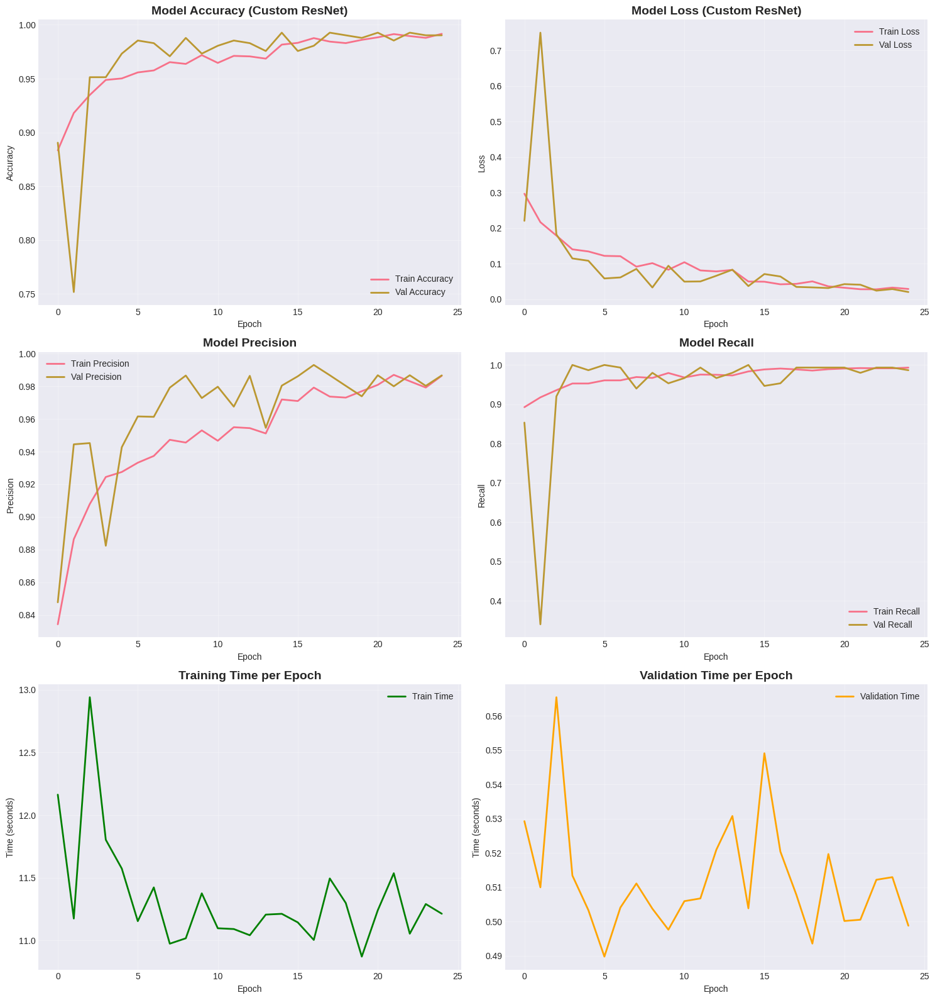

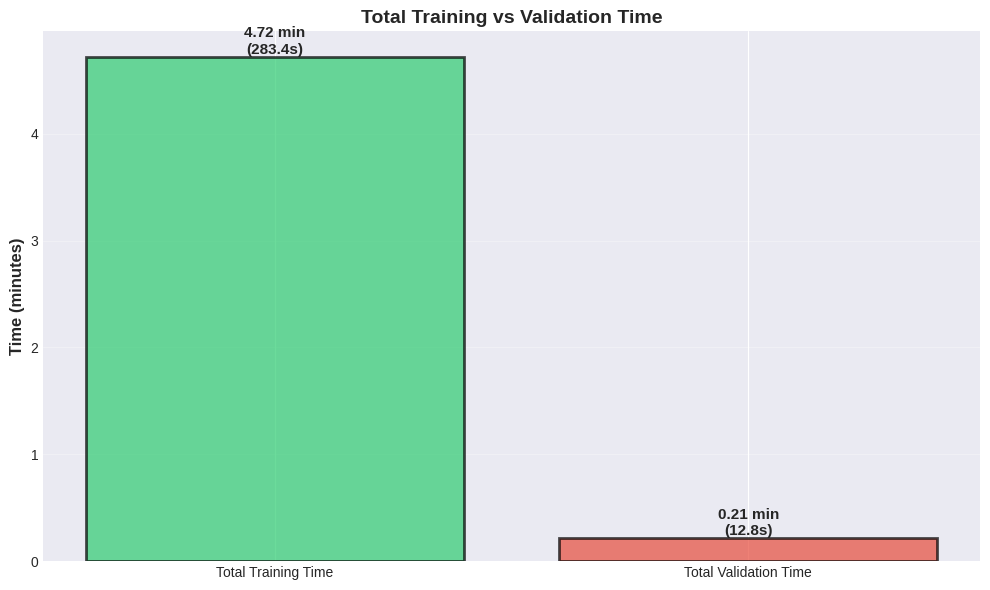

<Figure size 640x480 with 0 Axes>

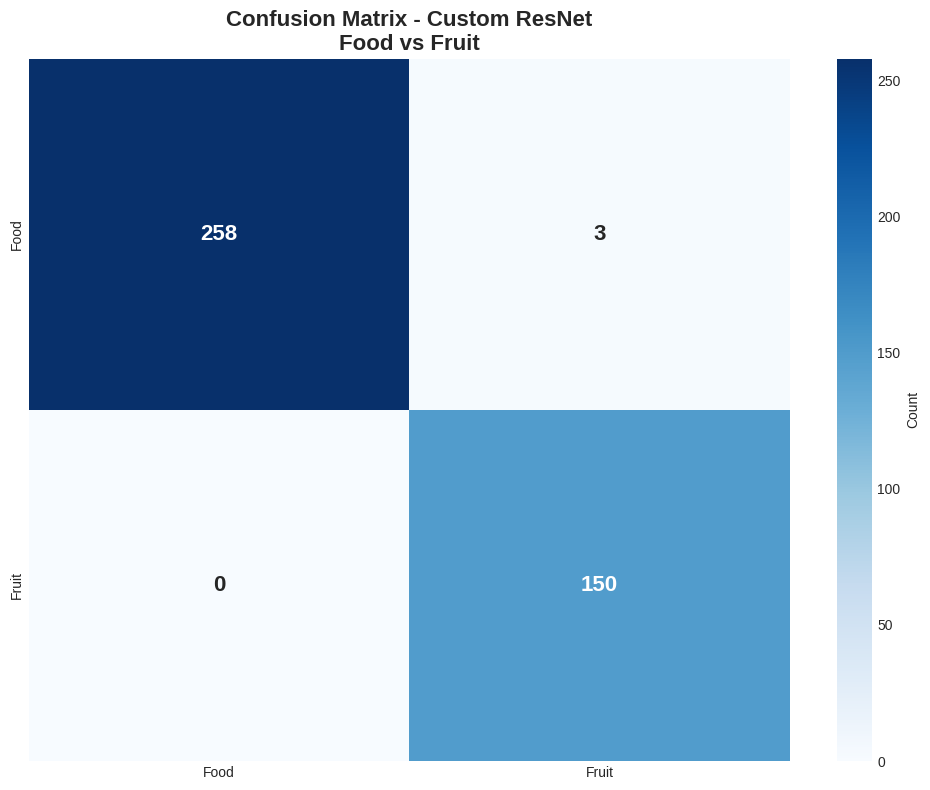


FINAL RESULTS SUMMARY - Custom ResNet
✅ Validation Accuracy: 99.27%
✅ Total Parameters: 2,783,298
⏱️ Total Training Time: 283.41s (4.72 min)
⏱️ Total Validation Time: 12.81s (0.21 min)
⏱️ Average Time per Epoch: 11.85s

🎉 Part A (Custom CNN) Complete!


In [ ]:
# ==========================================
# 7. EVALUATION
# ==========================================

checkpoint = torch.load('models/part_a_best_custom.pth')
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

print("\n📊 Evaluating Model on Validation Set...")
print("=" * 70)

y_pred_list = []
y_true_list = []

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        y_pred_list.extend(predicted.cpu().numpy())
        y_true_list.extend(labels.cpu().numpy())

y_pred = np.array(y_pred_list)
y_true = np.array(y_true_list)

val_accuracy = accuracy_score(y_true, y_pred)
print(f"\n✅ Validation Accuracy: {val_accuracy*100:.2f}%")

print("\n📋 Classification Report:")
print("-" * 70)
print(classification_report(y_true, y_pred, target_names=['Food', 'Fruit'], digits=4))

cm = confusion_matrix(y_true, y_pred)
print("\n📊 Confusion Matrix:")
print(cm)

# ==========================================
# 7. VISUALIZATION (MODIFIED - ADD TIME PLOTS)
# ==========================================

print("\n📈 Generating Visualizations...")
print("-" * 70)

fig, axes = plt.subplots(3, 2, figsize=(15, 16))

# Accuracy
axes[0, 0].plot(history['train_acc'], label='Train Accuracy', linewidth=2)
axes[0, 0].plot(history['val_acc'], label='Val Accuracy', linewidth=2)
axes[0, 0].set_title('Model Accuracy (Custom ResNet)', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Loss
axes[0, 1].plot(history['train_loss'], label='Train Loss', linewidth=2)
axes[0, 1].plot(history['val_loss'], label='Val Loss', linewidth=2)
axes[0, 1].set_title('Model Loss (Custom ResNet)', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Precision
axes[1, 0].plot(history['train_precision'], label='Train Precision', linewidth=2)
axes[1, 0].plot(history['val_precision'], label='Val Precision', linewidth=2)
axes[1, 0].set_title('Model Precision', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Precision')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Recall
axes[1, 1].plot(history['train_recall'], label='Train Recall', linewidth=2)
axes[1, 1].plot(history['val_recall'], label='Val Recall', linewidth=2)
axes[1, 1].set_title('Model Recall', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Recall')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

axes[2, 0].plot(history['train_time'], label='Train Time', linewidth=2, color='green')
axes[2, 0].set_title('Training Time per Epoch', fontsize=14, fontweight='bold')
axes[2, 0].set_xlabel('Epoch')
axes[2, 0].set_ylabel('Time (seconds)')
axes[2, 0].legend()
axes[2, 0].grid(True, alpha=0.3)

axes[2, 1].plot(history['val_time'], label='Validation Time', linewidth=2, color='orange')
axes[2, 1].set_title('Validation Time per Epoch', fontsize=14, fontweight='bold')
axes[2, 1].set_xlabel('Epoch')
axes[2, 1].set_ylabel('Time (seconds)')
axes[2, 1].legend()
axes[2, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_history_custom.png', dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(10, 6))
times = [total_train_time/60, total_val_time/60]
labels = ['Total Training Time', 'Total Validation Time']
colors = ['#2ecc71', '#e74c3c']

bars = plt.bar(labels, times, color=colors, alpha=0.7, edgecolor='black', linewidth=2)
plt.ylabel('Time (minutes)', fontsize=12, fontweight='bold')
plt.title('Total Training vs Validation Time', fontsize=14, fontweight='bold')
plt.grid(axis='y', alpha=0.3)

for bar, time_val in zip(bars, times):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{time_val:.2f} min\n({time_val*60:.1f}s)',
             ha='center', va='bottom', fontweight='bold', fontsize=11)

plt.tight_layout()
plt.savefig('total_time_comparison.png', dpi=300, bbox_inches='tight')
plt.show()
plt.tight_layout()
plt.savefig('training_history_custom.png', dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Food', 'Fruit'],
            yticklabels=['Food', 'Fruit'],
            cbar_kws={'label': 'Count'},
            annot_kws={'size': 16, 'weight': 'bold'})
plt.title('Confusion Matrix - Custom ResNet\nFood vs Fruit', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix_custom.png', dpi=300, bbox_inches='tight')
plt.show()

# ==========================================
# FINAL SUMMARY (MODIFIED)
# ==========================================

print("\n" + "=" * 70)
print("FINAL RESULTS SUMMARY - Custom ResNet")
print("=" * 70)
print(f"✅ Validation Accuracy: {val_accuracy*100:.2f}%")
print(f"✅ Total Parameters: {total_params:,}")
print(f"⏱️ Total Training Time: {total_train_time:.2f}s ({total_train_time/60:.2f} min)")
print(f"⏱️ Total Validation Time: {total_val_time:.2f}s ({total_val_time/60:.2f} min)")
print(f"⏱️ Average Time per Epoch: {(total_train_time+total_val_time)/(epoch+1):.2f}s")
print("\n🎉 Part A (Custom CNN) Complete!")

In [ ]:
def predict_custom_image(image_path, model, device):
    """
    Function to predict a single image using the Custom ResNet model.
    Args:
        image_path (str): Path to the image file.
        model (torch.nn.Module): The trained CustomResNet model.
        device (torch.device): CPU or CUDA.
    """
    if not os.path.exists(image_path):
        print(f"❌ Error: Image path not found: {image_path}")
        return

    try:
        img_bgr = cv2.imread(image_path)
        if img_bgr is None:
            print(f"❌ Error: Could not read image file.")
            return

        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)


        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])

        input_tensor = transform(img_rgb)
        input_tensor = input_tensor.unsqueeze(0)  # Add batch dimension [1, 3, 224, 224]
        input_tensor = input_tensor.to(device)

        # 3. Inference
        model.eval()
        with torch.no_grad():
            outputs = model(input_tensor)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            max_prob, predicted_idx = torch.max(probs, 1)

        class_names = ['Food', 'Fruit']  # 0: Food, 1: Fruit
        pred_label = class_names[predicted_idx.item()]
        confidence = max_prob.item() * 100

        plt.figure(figsize=(6, 6))
        plt.imshow(img_rgb)

        title_color = 'green' if confidence > 70 else 'orange'
        plt.title(f"Prediction: {pred_label}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color=title_color)
        plt.axis('off')
        plt.show()

        print("-" * 40)
        print(f"🖼️ Image: {os.path.basename(image_path)}")
        print(f"✅ Predicted Class: {pred_label}")
        print(f"📊 Confidence: {confidence:.2f}%")
        print(f"📈 Probabilities -> Food: {probs[0][0]*100:.2f}% | Fruit: {probs[0][1]*100:.2f}%")
        print("-" * 40)

    except Exception as e:
        print(f"❌ An error occurred: {e}")

# ==========================================
# 📝 Usage Example
# ==========================================

model = CustomResNet(num_classes=2)
model = model.to(device)

model_path = 'models/part_a_best_custom.pth'

if os.path.exists(model_path):
    print(f"🔄 Loading model from {model_path}...")
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    print("✅ Model loaded successfully!")
else:
    print("⚠️ Model file not found. Using current model state (if trained).")


🔄 Loading model from models/part_a_best_custom.pth...
✅ Model loaded successfully!


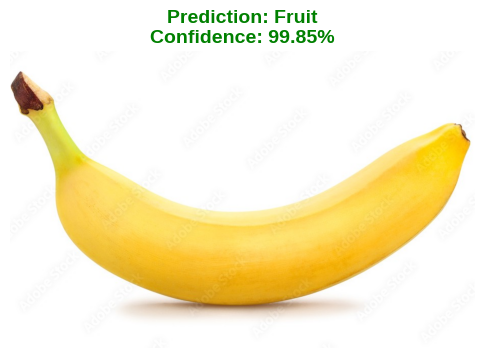

----------------------------------------
🖼️ Image: fruit10.jpeg
✅ Predicted Class: Fruit
📊 Confidence: 99.85%
📈 Probabilities -> Food: 0.15% | Fruit: 99.85%
----------------------------------------


In [ ]:
test_img_path = '/kaggle/input/test-kaggle/fruit/fruit10.jpeg'

predict_custom_image(test_img_path, model, device)

## **ResNET-18 with Train FC only & Freez Backbone , Fine Tuning With small LR**

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

PROJECT_DATA_PATH = '/kaggle/input/datasets-cv/Project Data'
FOOD_PATH = os.path.join(PROJECT_DATA_PATH, 'Food')
FRUIT_PATH = os.path.join(PROJECT_DATA_PATH, 'Fruit')
FOOD_TRAIN_PATH = os.path.join(FOOD_PATH, 'Train')
FOOD_VAL_PATH = os.path.join(FOOD_PATH, 'Validation')
FRUIT_TRAIN_PATH = os.path.join(FRUIT_PATH, 'Train')
FRUIT_VAL_PATH = os.path.join(FRUIT_PATH, 'Validation')

IMG_SIZE = 224
BATCH_SIZE = 32

STAGE1_EPOCHS = 10
STAGE2_EPOCHS = 20
STAGE1_LR = 0.001
STAGE2_LR = 0.00001

LABEL_MAPPING = {'Food': 0, 'Fruit': 1}

print("=" * 70)
print("PART A: PROGRESSIVE FINE-TUNING - ResNet18 PyTorch")
print("=" * 70)
print("🎯 Strategy:")
print("   Stage 1: Freeze backbone → Train FC only (10 epochs)")
print("   Stage 2: Unfreeze layer4 → Fine-tune (20 epochs)")
print("=" * 70)

# ======================== DATA LOADING ========================
def load_food_images(data_path, max_images_per_category=None):
    images = []
    labels = []

    categories = sorted(os.listdir(data_path))

    for category in categories:
        category_path = os.path.join(data_path, category)

        if not os.path.isdir(category_path):
            continue

        image_files = sorted(os.listdir(category_path))

        if max_images_per_category:
            image_files = image_files[:max_images_per_category]

        for img_file in image_files:
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(category_path, img_file)

                try:
                    img = cv2.imread(img_path)
                    if img is None:
                        continue
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                    images.append(img)
                    labels.append('Food')
                except Exception as e:
                    print(f"Error loading {img_path}: {e}")

    return images, labels

def load_fruit_images(data_path, max_images_per_category=None):
    images = []
    labels = []

    categories = sorted(os.listdir(data_path))

    for category in categories:
        images_path = os.path.join(data_path, category, 'Images')

        if not os.path.exists(images_path):
            continue

        image_files = sorted(os.listdir(images_path))

        if max_images_per_category:
            image_files = image_files[:max_images_per_category]

        for img_file in image_files:
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(images_path, img_file)

                try:
                    img = cv2.imread(img_path)
                    if img is None:
                        continue
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                    images.append(img)
                    labels.append('Fruit')
                except Exception as e:
                    print(f"Error loading {img_path}: {e}")

    return images, labels

print("\n📂 Loading Training Data...")
print("-" * 70)

food_train_images, food_train_labels = load_food_images(FOOD_TRAIN_PATH)
print(f"✅ Loaded {len(food_train_images)} Food training images")

fruit_train_images, fruit_train_labels = load_fruit_images(FRUIT_TRAIN_PATH)
print(f"✅ Loaded {len(fruit_train_images)} Fruit training images")

train_images = food_train_images + fruit_train_images
train_labels = food_train_labels + fruit_train_labels

X_train = np.array(train_images, dtype=np.uint8)
y_train_text = train_labels
y_train = np.array([LABEL_MAPPING[label] for label in y_train_text])

print(f"\n📊 Training Data Shape: {X_train.shape}")
print(f"📊 Training Labels Shape: {y_train.shape}")
print(f"   Food samples: {np.sum(y_train == 0)}")
print(f"   Fruit samples: {np.sum(y_train == 1)}")

print("\n📂 Loading Validation Data...")
print("-" * 70)

food_val_images, food_val_labels = load_food_images(FOOD_VAL_PATH)
print(f"✅ Loaded {len(food_val_images)} Food validation images")

fruit_val_images, fruit_val_labels = load_fruit_images(FRUIT_VAL_PATH)
print(f"✅ Loaded {len(fruit_val_images)} Fruit validation images")

val_images = food_val_images + fruit_val_images
val_labels = food_val_labels + fruit_val_labels

X_val = np.array(val_images, dtype=np.uint8)
y_val_text = val_labels
y_val = np.array([LABEL_MAPPING[label] for label in y_val_text])

print(f"\n📊 Validation Data Shape: {X_val.shape}")
print(f"📊 Validation Labels Shape: {y_val.shape}")
print(f"   Food samples: {np.sum(y_val == 0)}")
print(f"   Fruit samples: {np.sum(y_val == 1)}")

Using device: cuda
PART A: PROGRESSIVE FINE-TUNING - ResNet18 PyTorch
🎯 Strategy:
   Stage 1: Freeze backbone → Train FC only (10 epochs)
   Stage 2: Unfreeze layer4 → Fine-tune (20 epochs)

📂 Loading Training Data...
----------------------------------------------------------------------
✅ Loaded 2538 Food training images
✅ Loaded 1759 Fruit training images

📊 Training Data Shape: (4297, 224, 224, 3)
📊 Training Labels Shape: (4297,)
   Food samples: 2538
   Fruit samples: 1759

📂 Loading Validation Data...
----------------------------------------------------------------------
✅ Loaded 261 Food validation images
✅ Loaded 150 Fruit validation images

📊 Validation Data Shape: (411, 224, 224, 3)
📊 Validation Labels Shape: (411,)
   Food samples: 261
   Fruit samples: 150


In [ ]:
class FoodFruitDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(20),
    transforms.RandomHorizontalFlip(),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = FoodFruitDataset(X_train, y_train, transform=train_transform)
val_dataset = FoodFruitDataset(X_val, y_val, transform=val_transform)

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = torch.FloatTensor(class_weights).to(device)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)


In [ ]:
# ======================== MODEL ========================
class FoodFruitClassifier(nn.Module):
    def __init__(self, pretrained=True):
        super(FoodFruitClassifier, self).__init__()
        self.resnet = models.resnet18(pretrained=pretrained)
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_features, 2)

    def forward(self, x):
        return self.resnet(x)

model = FoodFruitClassifier(pretrained=True)
model = model.to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)

print("\n🏗️ Model Architecture:")
print("-" * 70)
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"✅ Total Parameters: {total_params:,}")
print(f"✅ Trainable Parameters: {trainable_params:,}")

os.makedirs('models', exist_ok=True)

history = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': [],
    'train_precision': [], 'train_recall': [],
    'val_precision': [], 'val_recall': [],
    'train_time': [], 'val_time': [],
    'stage': []
}


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 184MB/s] 



🏗️ Model Architecture:
----------------------------------------------------------------------
✅ Total Parameters: 11,177,538
✅ Trainable Parameters: 11,177,538


In [ ]:
# ======================== HELPER FUNCTIONS ========================
def freeze_backbone(model):
    """Freeze all layers except FC"""
    for param in model.resnet.parameters():
        param.requires_grad = False
    # Unfreeze FC layer
    for param in model.resnet.fc.parameters():
        param.requires_grad = True

def unfreeze_layer4(model):
    """Unfreeze layer4 (last residual block) + FC"""
    for param in model.resnet.layer4.parameters():
        param.requires_grad = True
    for param in model.resnet.fc.parameters():
        param.requires_grad = True

def count_trainable_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

import time

# ======================== HELPER FUNCTIONS (معدلة) ========================
def train_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    tp, fp, fn = 0, 0, 0

    start_time = time.time()  # إضافة

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        tp += ((predicted == 1) & (labels == 1)).sum().item()
        fp += ((predicted == 1) & (labels == 0)).sum().item()
        fn += ((predicted == 0) & (labels == 1)).sum().item()

    train_time = time.time() - start_time  # إضافة

    epoch_loss = running_loss / len(loader)
    epoch_acc = correct / total
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    return epoch_loss, epoch_acc, precision, recall, train_time  # تعديل


def validate_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    tp, fp, fn = 0, 0, 0

    start_time = time.time()  # إضافة

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            tp += ((predicted == 1) & (labels == 1)).sum().item()
            fp += ((predicted == 1) & (labels == 0)).sum().item()
            fn += ((predicted == 0) & (labels == 1)).sum().item()

    val_time = time.time() - start_time  # إضافة

    epoch_loss = running_loss / len(loader)
    epoch_acc = correct / total
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    return epoch_loss, epoch_acc, precision, recall, val_time

In [ ]:
# ======================== STAGE 1: TRAIN FC ONLY ========================
print("\n" + "=" * 70)
print("🎯 STAGE 1: Training FC Layer Only (Backbone Frozen)")
print("=" * 70)

freeze_backbone(model)
trainable_params = count_trainable_params(model)
print(f"✅ Trainable Parameters: {trainable_params:,}")
print(f"✅ Learning Rate: {STAGE1_LR}")
print(f"✅ Epochs: {STAGE1_EPOCHS}")
print("-" * 70)

optimizer_stage1 = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=STAGE1_LR)
scheduler_stage1 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage1, mode='min', factor=0.5, patience=3, verbose=True)

best_val_acc = 0.0

for epoch in range(STAGE1_EPOCHS):
    train_loss, train_acc, train_prec, train_rec, train_time = train_epoch(model, train_loader, criterion, optimizer_stage1, device)
    val_loss, val_acc, val_prec, val_rec, val_time = validate_epoch(model, val_loader, criterion, device)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['train_precision'].append(train_prec)
    history['train_recall'].append(train_rec)
    history['val_precision'].append(val_prec)
    history['val_recall'].append(val_rec)
    history['train_time'].append(train_time)
    history['val_time'].append(val_time)
    history['stage'].append(1)

    scheduler_stage1.step(val_loss)

    print(f"Epoch [{epoch+1}/{STAGE1_EPOCHS}] "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} Time: {train_time:.2f}s | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} Time: {val_time:.2f}s")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({
            'epoch': epoch,
            'model_state_dict_FC': model.state_dict(),
            'optimizer_state_dict_FC': optimizer_stage1.state_dict(),
            'val_acc': val_acc,
            'stage': 1
        }, 'models/stage1_best_FC.pth')
        print(f"   ✅ Stage 1 model saved with val_acc: {val_acc:.4f}")

print(f"\n✅ Stage 1 Complete! Best Val Acc: {best_val_acc:.4f}")



🎯 STAGE 1: Training FC Layer Only (Backbone Frozen)
✅ Trainable Parameters: 1,026
✅ Learning Rate: 0.001
✅ Epochs: 10
----------------------------------------------------------------------
Epoch [1/10] Train Loss: 0.1875 Acc: 0.9374 Time: 10.45s | Val Loss: 0.0522 Acc: 0.9903 Time: 0.56s
   ✅ Stage 1 model saved with val_acc: 0.9903
Epoch [2/10] Train Loss: 0.0650 Acc: 0.9856 Time: 10.37s | Val Loss: 0.0259 Acc: 1.0000 Time: 0.58s
   ✅ Stage 1 model saved with val_acc: 1.0000
Epoch [3/10] Train Loss: 0.0430 Acc: 0.9898 Time: 10.37s | Val Loss: 0.0238 Acc: 0.9927 Time: 0.56s
Epoch [4/10] Train Loss: 0.0467 Acc: 0.9853 Time: 10.59s | Val Loss: 0.0168 Acc: 1.0000 Time: 0.58s
Epoch [5/10] Train Loss: 0.0354 Acc: 0.9893 Time: 10.61s | Val Loss: 0.0137 Acc: 0.9976 Time: 0.54s
Epoch [6/10] Train Loss: 0.0311 Acc: 0.9900 Time: 10.76s | Val Loss: 0.0101 Acc: 1.0000 Time: 0.57s
Epoch [7/10] Train Loss: 0.0253 Acc: 0.9926 Time: 10.50s | Val Loss: 0.0093 Acc: 1.0000 Time: 0.59s
Epoch [8/10] Train

In [ ]:
# ======================== STAGE 2: FINE-TUNE LAYER4 + FC ========================
print("\n" + "=" * 70)
print("🎯 STAGE 2: Fine-tuning Layer4 + FC (Very Low LR)")
print("=" * 70)

unfreeze_layer4(model)
trainable_params = count_trainable_params(model)
print(f"✅ Trainable Parameters: {trainable_params:,}")
print(f"✅ Learning Rate: {STAGE2_LR}")
print(f"✅ Epochs: {STAGE2_EPOCHS}")
print("-" * 70)

optimizer_stage2 = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=STAGE2_LR)
scheduler_stage2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage2, mode='min', factor=0.5, patience=4, verbose=True)

patience_counter = 0
patience = 10

for epoch in range(STAGE2_EPOCHS):
    train_loss, train_acc, train_prec, train_rec, train_time = train_epoch(model, train_loader, criterion, optimizer_stage2, device)
    val_loss, val_acc, val_prec, val_rec, val_time = validate_epoch(model, val_loader, criterion, device)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['train_precision'].append(train_prec)
    history['train_recall'].append(train_rec)
    history['val_precision'].append(val_prec)
    history['val_recall'].append(val_rec)
    history['train_time'].append(train_time)  # إضافة
    history['val_time'].append(val_time)  # إضافة
    history['stage'].append(2)

    scheduler_stage2.step(val_loss)

    print(f"Epoch [{STAGE1_EPOCHS + epoch+1}/{STAGE1_EPOCHS + STAGE2_EPOCHS}] "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} Time: {train_time:.2f}s | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} Time: {val_time:.2f}s")
    # ...

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        patience_counter = 0
        torch.save({
            'epoch': STAGE1_EPOCHS + epoch,
            'model_state_dict_fine': model.state_dict(),
            'optimizer_state_dict_fine': optimizer_stage2.state_dict(),
            'val_acc': val_acc,
            'stage': 2
        }, 'models/part_a_best_fine.pth')
        print(f"   ✅ Best model saved with val_acc: {val_acc:.4f}")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"\n Early stopping triggered after {STAGE1_EPOCHS + epoch+1} total epochs")
            break

print(f"\n✅ Stage 2 Complete! Best Val Acc: {best_val_acc:.4f}")


🎯 STAGE 2: Fine-tuning Layer4 + FC (Very Low LR)
✅ Trainable Parameters: 8,394,754
✅ Learning Rate: 1e-05
✅ Epochs: 20
----------------------------------------------------------------------
Epoch [11/30] Train Loss: 0.0169 Acc: 0.9944 Time: 10.61s | Val Loss: 0.0031 Acc: 1.0000 Time: 0.56s
Epoch [12/30] Train Loss: 0.0083 Acc: 0.9972 Time: 10.54s | Val Loss: 0.0019 Acc: 1.0000 Time: 0.58s
Epoch [13/30] Train Loss: 0.0076 Acc: 0.9981 Time: 10.63s | Val Loss: 0.0014 Acc: 1.0000 Time: 0.56s
Epoch [14/30] Train Loss: 0.0076 Acc: 0.9974 Time: 10.61s | Val Loss: 0.0008 Acc: 1.0000 Time: 0.58s
Epoch [15/30] Train Loss: 0.0051 Acc: 0.9986 Time: 10.41s | Val Loss: 0.0005 Acc: 1.0000 Time: 0.55s
Epoch [16/30] Train Loss: 0.0045 Acc: 0.9988 Time: 10.61s | Val Loss: 0.0009 Acc: 1.0000 Time: 0.57s
Epoch [17/30] Train Loss: 0.0051 Acc: 0.9979 Time: 10.53s | Val Loss: 0.0002 Acc: 1.0000 Time: 0.57s
Epoch [18/30] Train Loss: 0.0013 Acc: 0.9998 Time: 10.75s | Val Loss: 0.0002 Acc: 1.0000 Time: 0.58s
E

In [ ]:
# ======================== EVALUATION ========================
print("\n" + "=" * 70)
print("📊 FINAL EVALUATION ON VALIDATION SET")
print("=" * 70)

model_path = 'models/part_a_best_fine.pth'

if not os.path.exists(model_path):
    print("⚠️ part_a_best.pth not found, loading Stage 1 best model instead")
    model_path = 'models/stage1_best_FC.pth'

checkpoint = torch.load(model_path)
model.load_state_dict(checkpoint['model_state_dict_FC'])
model.eval()
model.load_state_dict(checkpoint['model_state_dict_FC'])
model.eval()

y_pred_list = []
y_true_list = []

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        y_pred_list.extend(predicted.cpu().numpy())
        y_true_list.extend(labels.cpu().numpy())

y_pred = np.array(y_pred_list)
y_true = np.array(y_true_list)

val_accuracy = accuracy_score(y_true, y_pred)
print(f"\n✅ Final Validation Accuracy: {val_accuracy*100:.2f}%")

print("\n📋 Classification Report:")
print("-" * 70)
print(classification_report(y_true, y_pred, target_names=['Food', 'Fruit'], digits=4))

cm = confusion_matrix(y_true, y_pred)
print("\n📊 Confusion Matrix:")
print(cm)



📊 FINAL EVALUATION ON VALIDATION SET
⚠️ part_a_best.pth not found, loading Stage 1 best model instead

✅ Final Validation Accuracy: 100.00%

📋 Classification Report:
----------------------------------------------------------------------
              precision    recall  f1-score   support

        Food     1.0000    1.0000    1.0000       261
       Fruit     1.0000    1.0000    1.0000       150

    accuracy                         1.0000       411
   macro avg     1.0000    1.0000    1.0000       411
weighted avg     1.0000    1.0000    1.0000       411


📊 Confusion Matrix:
[[261   0]
 [  0 150]]



📈 Generating Visualizations...
----------------------------------------------------------------------


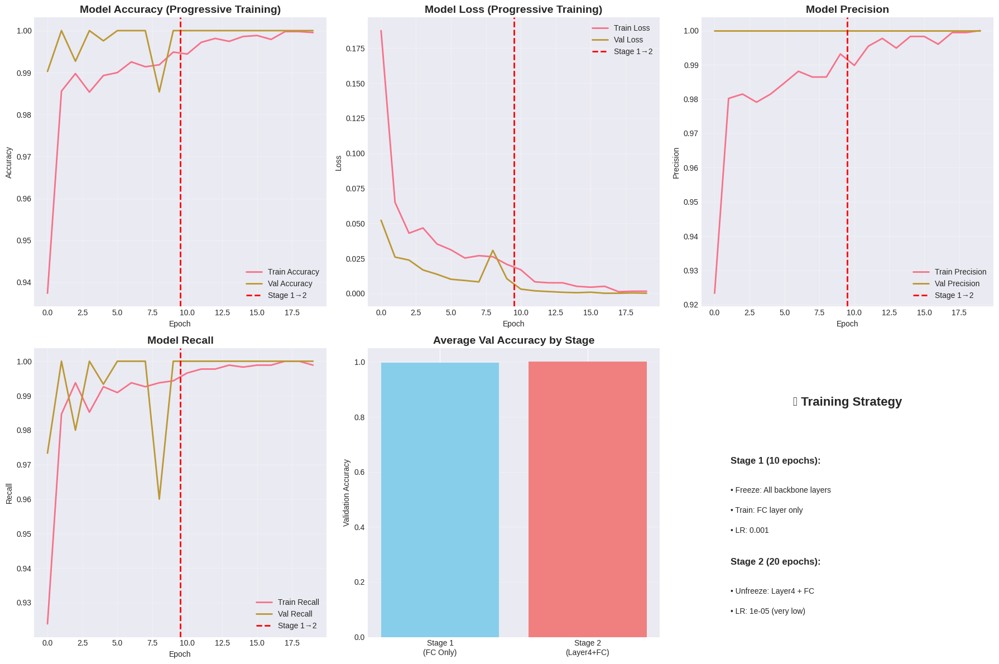

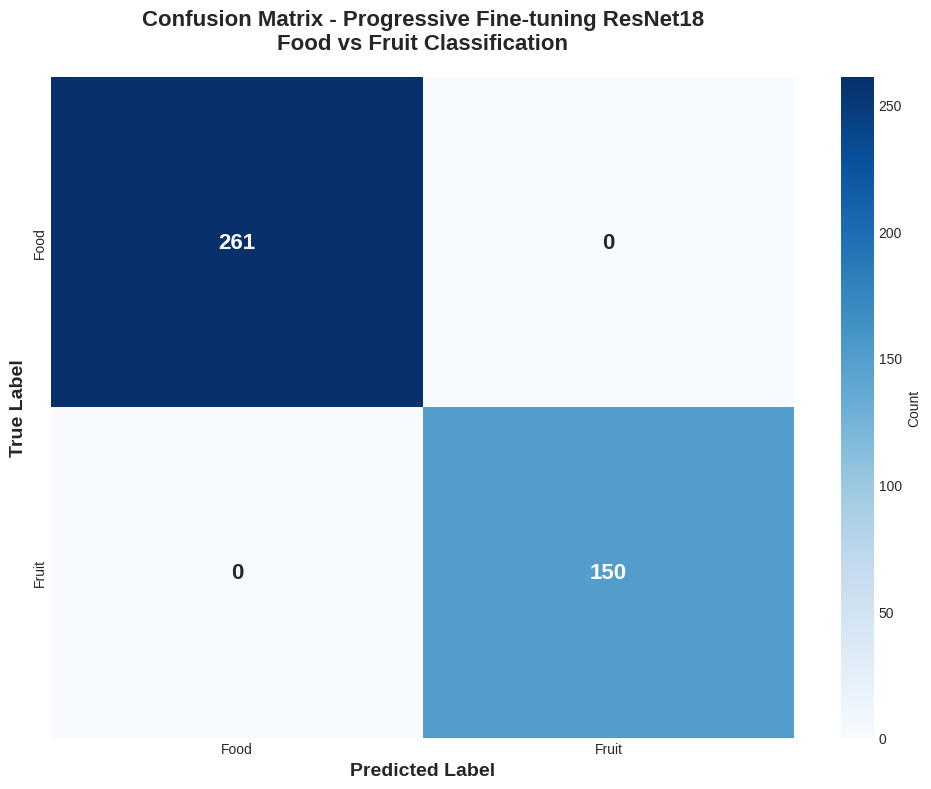

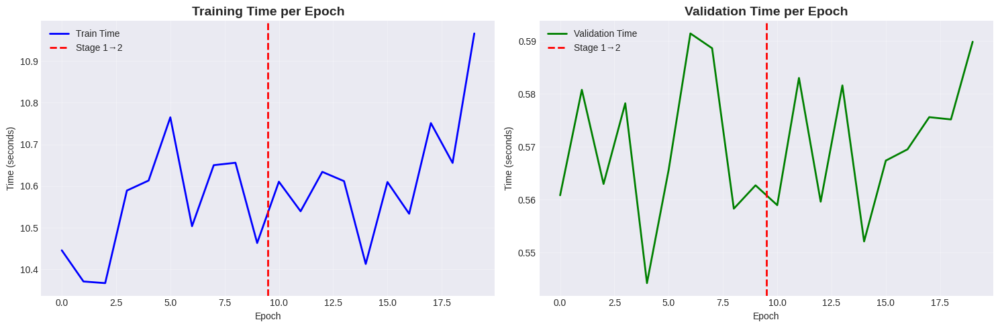


⏱️ TIMING SUMMARY:
Total Training Time: 211.75s (3.53 min)
Total Validation Time: 11.41s (0.19 min)
Average Training Time/Epoch: 10.59s
Average Validation Time/Epoch: 0.57s
Total Time: 3.72 min


In [ ]:
# ======================== VISUALIZATIONS ========================
print("\n📈 Generating Visualizations...")
print("-" * 70)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Add stage separators
stage1_end = STAGE1_EPOCHS
total_epochs = len(history['train_acc'])

# Accuracy
axes[0, 0].plot(history['train_acc'], label='Train Accuracy', linewidth=2)
axes[0, 0].plot(history['val_acc'], label='Val Accuracy', linewidth=2)
axes[0, 0].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[0, 0].set_title('Model Accuracy (Progressive Training)', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Loss
axes[0, 1].plot(history['train_loss'], label='Train Loss', linewidth=2)
axes[0, 1].plot(history['val_loss'], label='Val Loss', linewidth=2)
axes[0, 1].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[0, 1].set_title('Model Loss (Progressive Training)', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Precision
axes[0, 2].plot(history['train_precision'], label='Train Precision', linewidth=2)
axes[0, 2].plot(history['val_precision'], label='Val Precision', linewidth=2)
axes[0, 2].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[0, 2].set_title('Model Precision', fontsize=14, fontweight='bold')
axes[0, 2].set_xlabel('Epoch')
axes[0, 2].set_ylabel('Precision')
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3)

# Recall
axes[1, 0].plot(history['train_recall'], label='Train Recall', linewidth=2)
axes[1, 0].plot(history['val_recall'], label='Val Recall', linewidth=2)
axes[1, 0].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[1, 0].set_title('Model Recall', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Recall')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Stage comparison
stage1_val_acc = history['val_acc'][:stage1_end]
stage2_val_acc = history['val_acc'][stage1_end:]
axes[1, 1].bar(['Stage 1\n(FC Only)', 'Stage 2\n(Layer4+FC)'],
               [np.mean(stage1_val_acc), np.mean(stage2_val_acc)],
               color=['skyblue', 'lightcoral'])
axes[1, 1].set_title('Average Val Accuracy by Stage', fontsize=14, fontweight='bold')
axes[1, 1].set_ylabel('Validation Accuracy')
axes[1, 1].grid(True, alpha=0.3, axis='y')

# Training strategy diagram
axes[1, 2].text(0.5, 0.8, '🎯 Training Strategy', ha='center', fontsize=16, fontweight='bold', transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.6, f'Stage 1 ({STAGE1_EPOCHS} epochs):', fontsize=12, fontweight='bold', transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.5, f'• Freeze: All backbone layers', fontsize=10, transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.43, f'• Train: FC layer only', fontsize=10, transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.36, f'• LR: {STAGE1_LR}', fontsize=10, transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.25, f'Stage 2 ({STAGE2_EPOCHS} epochs):', fontsize=12, fontweight='bold', transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.15, f'• Unfreeze: Layer4 + FC', fontsize=10, transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.08, f'• LR: {STAGE2_LR} (very low)', fontsize=10, transform=axes[1, 2].transAxes)
axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig('progressive_training_history.png', dpi=300, bbox_inches='tight')
plt.show()

# Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Food', 'Fruit'],
            yticklabels=['Food', 'Fruit'],
            cbar_kws={'label': 'Count'},
            annot_kws={'size': 16, 'weight': 'bold'})
plt.title('Confusion Matrix - Progressive Fine-tuning ResNet18\nFood vs Fruit Classification',
          fontsize=16, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix_progressive.png', dpi=300, bbox_inches='tight')
plt.show()
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Training Time per Epoch
axes[0].plot(history['train_time'], label='Train Time', linewidth=2, color='blue')
axes[0].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[0].set_title('Training Time per Epoch', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Time (seconds)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Validation Time per Epoch
axes[1].plot(history['val_time'], label='Validation Time', linewidth=2, color='green')
axes[1].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[1].set_title('Validation Time per Epoch', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Time (seconds)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_times.png', dpi=300, bbox_inches='tight')
plt.show()

# Total times summary
total_train_time = sum(history['train_time'])
total_val_time = sum(history['val_time'])
avg_train_time = np.mean(history['train_time'])
avg_val_time = np.mean(history['val_time'])

print("\n⏱️ TIMING SUMMARY:")
print("=" * 70)
print(f"Total Training Time: {total_train_time:.2f}s ({total_train_time/60:.2f} min)")
print(f"Total Validation Time: {total_val_time:.2f}s ({total_val_time/60:.2f} min)")
print(f"Average Training Time/Epoch: {avg_train_time:.2f}s")
print(f"Average Validation Time/Epoch: {avg_val_time:.2f}s")
print(f"Total Time: {(total_train_time + total_val_time)/60:.2f} min")
print("=" * 70)

In [ ]:
# ======================== FINAL SUMMARY ========================
print("\n" + "=" * 70)
print("FINAL RESULTS SUMMARY - PROGRESSIVE FINE-TUNING")
print("=" * 70)
print(f"✅ Final Validation Accuracy: {val_accuracy*100:.2f}%")
print(f"✅ Best Validation Accuracy: {best_val_acc*100:.2f}%")
print(f"✅ Total Training Samples: {len(X_train)}")
print(f"✅ Total Validation Samples: {len(X_val)}")
print(f"✅ Model Architecture: ResNet18 (Progressive Fine-tuning)")
print(f"✅ Total Parameters: {total_params:,}")
print(f"\n📊 Training Strategy:")
print(f"   Stage 1: {STAGE1_EPOCHS} epochs, FC only, LR={STAGE1_LR}")
print(f"   Stage 2: {len([s for s in history['stage'] if s == 2])} epochs, Layer4+FC, LR={STAGE2_LR}")
print("=" * 70)

print("\n✅ Models saved:")
print("   - models/stage1_best.pth (Stage 1 checkpoint)")
print("   - models/part_a_best.pth (Final best model)")
print(" All visualizations saved successfully!")
print("\n Progressive Fine-tuning Complete! ")


FINAL RESULTS SUMMARY - PROGRESSIVE FINE-TUNING
✅ Final Validation Accuracy: 100.00%
✅ Best Validation Accuracy: 100.00%
✅ Total Training Samples: 4297
✅ Total Validation Samples: 411
✅ Model Architecture: ResNet18 (Progressive Fine-tuning)
✅ Total Parameters: 11,177,538

📊 Training Strategy:
   Stage 1: 10 epochs, FC only, LR=0.001
   Stage 2: 10 epochs, Layer4+FC, LR=1e-05

✅ Models saved:
   - models/stage1_best.pth (Stage 1 checkpoint)
   - models/part_a_best.pth (Final best model)
 All visualizations saved successfully!

 Progressive Fine-tuning Complete! 


⚠️ Using current model in memory.
----------------------------------------
🖼️ Image: test4.png
✅ Prediction: Fruit
📊 Confidence: 97.95%
📈 Probabilities -> Food: 2.05% | Fruit: 97.95%
----------------------------------------


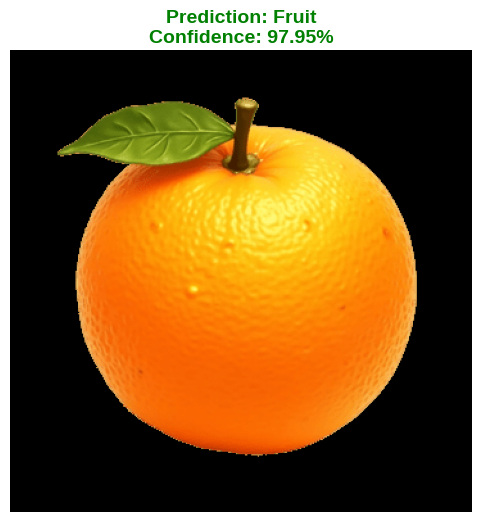

In [ ]:
def predict_external_image(image_path, model, device):
    """
    Function to predict a single external image.
    Args:
        image_path (str): Path to the image file.
        model (torch.nn.Module): The trained model.
        device (torch.device): CPU or CUDA.
    """
    # 1. Load the Image
    if not os.path.exists(image_path):
        print(f"❌ Error: Image path not found: {image_path}")
        return

    try:
        img = cv2.imread(image_path)
        if img is None:
            print(f"❌ Error: Could not read image at {image_path}")
            return

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])

        input_tensor = transform(img_rgb)
        input_tensor = input_tensor.unsqueeze(0) # Add batch dimension [1, 3, 224, 224]
        input_tensor = input_tensor.to(device)

        # 4. Inference
        model.eval()
        with torch.no_grad():
            outputs = model(input_tensor)
            probs = torch.nn.functional.softmax(outputs, dim=1) # Get probabilities
            max_prob, predicted_class = torch.max(probs, 1)

        class_names = ['Food', 'Fruit'] # 0: Food, 1: Fruit
        pred_label = class_names[predicted_class.item()]
        confidence = max_prob.item() * 100

        plt.figure(figsize=(6, 6))
        plt.imshow(img_rgb)

        title_color = 'green' if confidence > 70 else 'orange'

        plt.title(f"Prediction: {pred_label}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color=title_color)
        plt.axis('off')

        print("-" * 40)
        print(f"🖼️ Image: {os.path.basename(image_path)}")
        print(f"✅ Prediction: {pred_label}")
        print(f"📊 Confidence: {confidence:.2f}%")
        print(f"📈 Probabilities -> Food: {probs[0][0]*100:.2f}% | Fruit: {probs[0][1]*100:.2f}%")
        print("-" * 40)

        plt.show()

    except Exception as e:
        print(f" An error occurred: {e}")

# ==========================================
#   (Usage Example)
# ==========================================

best_model_path = 'models/part_a_best_fine.pth'
if os.path.exists(best_model_path):
    checkpoint = torch.load(best_model_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict_FC'])
    print("✅ Loaded best model from disk.")
else:
    print("⚠️ Using current model in memory.")

model.to(device)

test_image_path = '/kaggle/input/test-google/test4.png'
predict_external_image(test_image_path, model, device)

## **MobileNet V2 with Freez and Fine Tuning**

In [ ]:
import time
# ======================== CONFIGURATION ========================
PROJECT_DATA_PATH = '/kaggle/input/datasets-cv/Project Data'
FOOD_PATH = os.path.join(PROJECT_DATA_PATH, 'Food')
FRUIT_PATH = os.path.join(PROJECT_DATA_PATH, 'Fruit')
FOOD_TRAIN_PATH = os.path.join(FOOD_PATH, 'Train')
FOOD_VAL_PATH = os.path.join(FOOD_PATH, 'Validation')
FRUIT_TRAIN_PATH = os.path.join(FRUIT_PATH, 'Train')
FRUIT_VAL_PATH = os.path.join(FRUIT_PATH, 'Validation')

IMG_SIZE = 224
BATCH_SIZE = 32

# 🔥 PROGRESSIVE TRAINING STRATEGY
STAGE1_EPOCHS = 10
STAGE2_EPOCHS = 20
STAGE1_LR = 0.001
STAGE2_LR = 0.00001

LABEL_MAPPING = {'Food': 0, 'Fruit': 1}

print("=" * 70)
print("PART A: PROGRESSIVE FINE-TUNING - MobileNet V2")
print("=" * 70)
print("🎯 Strategy:")
print("   Stage 1: Freeze backbone (features) → Train Classifier only (10 epochs)")
print("   Stage 2: Unfreeze last 5 feature layers → Fine-tune (20 epochs)")
print("=" * 70)

# ======================== DATA LOADING ========================
def load_food_images(data_path, max_images_per_category=None):
    images = []
    labels = []

    categories = sorted(os.listdir(data_path))

    for category in categories:
        category_path = os.path.join(data_path, category)

        if not os.path.isdir(category_path):
            continue

        image_files = sorted(os.listdir(category_path))

        if max_images_per_category:
            image_files = image_files[:max_images_per_category]

        for img_file in image_files:
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(category_path, img_file)

                try:
                    img = cv2.imread(img_path)
                    if img is None:
                        continue
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                    images.append(img)
                    labels.append('Food')
                except Exception as e:
                    print(f"Error loading {img_path}: {e}")

    return images, labels

def load_fruit_images(data_path, max_images_per_category=None):
    images = []
    labels = []

    categories = sorted(os.listdir(data_path))

    for category in categories:
        images_path = os.path.join(data_path, category, 'Images')

        if not os.path.exists(images_path):
            continue

        image_files = sorted(os.listdir(images_path))

        if max_images_per_category:
            image_files = image_files[:max_images_per_category]

        for img_file in image_files:
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(images_path, img_file)

                try:
                    img = cv2.imread(img_path)
                    if img is None:
                        continue
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                    images.append(img)
                    labels.append('Fruit')
                except Exception as e:
                    print(f"Error loading {img_path}: {e}")

    return images, labels

print("\n📂 Loading Training Data...")
print("-" * 70)

food_train_images, food_train_labels = load_food_images(FOOD_TRAIN_PATH)
print(f"✅ Loaded {len(food_train_images)} Food training images")

fruit_train_images, fruit_train_labels = load_fruit_images(FRUIT_TRAIN_PATH)
print(f"✅ Loaded {len(fruit_train_images)} Fruit training images")

train_images = food_train_images + fruit_train_images
train_labels = food_train_labels + fruit_train_labels

X_train = np.array(train_images, dtype=np.uint8)
y_train_text = train_labels
y_train = np.array([LABEL_MAPPING[label] for label in y_train_text])

print(f"\n📊 Training Data Shape: {X_train.shape}")
print(f"📊 Training Labels Shape: {y_train.shape}")
print(f"   Food samples: {np.sum(y_train == 0)}")
print(f"   Fruit samples: {np.sum(y_train == 1)}")

print("\n📂 Loading Validation Data...")
print("-" * 70)

food_val_images, food_val_labels = load_food_images(FOOD_VAL_PATH)
print(f"✅ Loaded {len(food_val_images)} Food validation images")

fruit_val_images, fruit_val_labels = load_fruit_images(FRUIT_VAL_PATH)
print(f"✅ Loaded {len(fruit_val_images)} Fruit validation images")

val_images = food_val_images + fruit_val_images
val_labels = food_val_labels + fruit_val_labels

X_val = np.array(val_images, dtype=np.uint8)
y_val_text = val_labels
y_val = np.array([LABEL_MAPPING[label] for label in y_val_text])

print(f"\n📊 Validation Data Shape: {X_val.shape}")
print(f"📊 Validation Labels Shape: {y_val.shape}")
print(f"   Food samples: {np.sum(y_val == 0)}")
print(f"   Fruit samples: {np.sum(y_val == 1)}")

PART A: PROGRESSIVE FINE-TUNING - MobileNet V2
🎯 Strategy:
   Stage 1: Freeze backbone (features) → Train Classifier only (10 epochs)
   Stage 2: Unfreeze last 5 feature layers → Fine-tune (20 epochs)

📂 Loading Training Data...
----------------------------------------------------------------------
✅ Loaded 2538 Food training images
✅ Loaded 1759 Fruit training images

📊 Training Data Shape: (4297, 224, 224, 3)
📊 Training Labels Shape: (4297,)
   Food samples: 2538
   Fruit samples: 1759

📂 Loading Validation Data...
----------------------------------------------------------------------
✅ Loaded 261 Food validation images
✅ Loaded 150 Fruit validation images

📊 Validation Data Shape: (411, 224, 224, 3)
📊 Validation Labels Shape: (411,)
   Food samples: 261
   Fruit samples: 150


In [ ]:
# ======================== DATASET ========================
class FoodFruitDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(20),
    transforms.RandomHorizontalFlip(),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = FoodFruitDataset(X_train, y_train, transform=train_transform)
val_dataset = FoodFruitDataset(X_val, y_val, transform=val_transform)

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = torch.FloatTensor(class_weights).to(device)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [ ]:
# ======================== MODEL: MOBILENET V2 ========================
class FoodFruitClassifier(nn.Module):
    def __init__(self, pretrained=True):
        super(FoodFruitClassifier, self).__init__()
        # Load MobileNet V2
        self.mobilenet = models.mobilenet_v2(pretrained=pretrained)

        # MobileNet V2 Structure:
        # - features (Convolutional layers)
        # - classifier (Sequential: Dropout -> Linear)

        # We need to replace the Linear layer at index [1] of the classifier
        # The input features for this linear layer is 1280 (last_channel)
        num_features = self.mobilenet.classifier[1].in_features
        self.mobilenet.classifier[1] = nn.Linear(num_features, 2)

    def forward(self, x):
        return self.mobilenet(x)

model = FoodFruitClassifier(pretrained=True)
model = model.to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)

print("\n🏗️ Model Architecture: MobileNet V2")
print("-" * 70)
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"✅ Total Parameters: {total_params:,}")
print(f"✅ Trainable Parameters: {trainable_params:,}")

os.makedirs('models', exist_ok=True)

history = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': [],
    'train_precision': [], 'train_recall': [],
    'val_precision': [], 'val_recall': [],
    'stage': []  # Track which stage each epoch belongs to
}

# ADD THIS - Time tracking
time_tracking = {
    'stage1_training_time': 0,
    'stage2_training_time': 0,
    'total_training_time': 0,
    'inference_time': 0
}


🏗️ Model Architecture: MobileNet V2
----------------------------------------------------------------------
✅ Total Parameters: 2,226,434
✅ Trainable Parameters: 2,226,434


In [ ]:
# ======================== HELPER FUNCTIONS (MOBILENET SPECIFIC) ========================
def freeze_backbone(model):
    """Freeze all feature layers, keep classifier trainable"""
    # Freeze the convolutional features
    for param in model.mobilenet.features.parameters():
        param.requires_grad = False

    # Ensure the classifier (Head) is trainable
    for param in model.mobilenet.classifier.parameters():
        param.requires_grad = True

def unfreeze_last_blocks(model):
    """Unfreeze the last few blocks of the features + classifier"""
    # MobileNet V2 'features' is a Sequential block with indices 0 to 18.
    # We will unfreeze the last 5 layers (indices 14-18) which contain high-level features.

    # Unfreeze last 5 feature layers
    for param in model.mobilenet.features[-5:].parameters():
        param.requires_grad = True

    # Ensure classifier is still trainable
    for param in model.mobilenet.classifier.parameters():
        param.requires_grad = True

In [ ]:
def count_trainable_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def train_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    tp, fp, fn = 0, 0, 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        tp += ((predicted == 1) & (labels == 1)).sum().item()
        fp += ((predicted == 1) & (labels == 0)).sum().item()
        fn += ((predicted == 0) & (labels == 1)).sum().item()

    epoch_loss = running_loss / len(loader)
    epoch_acc = correct / total
    train_precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    train_recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    return epoch_loss, epoch_acc, train_precision, train_recall

def validate_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    tp, fp, fn = 0, 0, 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            tp += ((predicted == 1) & (labels == 1)).sum().item()
            fp += ((predicted == 1) & (labels == 0)).sum().item()
            fn += ((predicted == 0) & (labels == 1)).sum().item()

    epoch_loss = running_loss / len(loader)
    epoch_acc = correct / total
    val_precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    val_recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    return epoch_loss, epoch_acc, val_precision, val_recall

In [ ]:
# ======================== STAGE 1: TRAIN CLASSIFIER ONLY ========================
print("\n" + "=" * 70)
print("🎯 STAGE 1: Training Classifier Only (Backbone Frozen)")
print("=" * 70)

freeze_backbone(model)
trainable_params = count_trainable_params(model)
print(f"✅ Trainable Parameters: {trainable_params:,}")
print(f"✅ Learning Rate: {STAGE1_LR}")
print(f"✅ Epochs: {STAGE1_EPOCHS}")
print("-" * 70)

optimizer_stage1 = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=STAGE1_LR)
scheduler_stage1 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage1, mode='min', factor=0.5, patience=3, verbose=True)

best_val_acc = 0.0

# ADD THIS - Start timing Stage 1
stage1_start_time = time.time()

for epoch in range(STAGE1_EPOCHS):
    train_loss, train_acc, train_prec, train_rec = train_epoch(model, train_loader, criterion, optimizer_stage1, device)
    val_loss, val_acc, val_prec, val_rec = validate_epoch(model, val_loader, criterion, device)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['train_precision'].append(train_prec)
    history['train_recall'].append(train_rec)
    history['val_precision'].append(val_prec)
    history['val_recall'].append(val_rec)
    history['stage'].append(1)

    scheduler_stage1.step(val_loss)

    print(f"Epoch [{epoch+1}/{STAGE1_EPOCHS}] "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer_stage1.state_dict(),
            'val_acc': val_acc,
            'stage': 1
        }, 'models/mobilenet_stage1_best.pth')
        print(f"   ✅ Stage 1 model saved with val_acc: {val_acc:.4f}")

# ADD THIS - End timing Stage 1
stage1_end_time = time.time()
time_tracking['stage1_training_time'] = stage1_end_time - stage1_start_time

print(f"\n✅ Stage 1 Complete! Best Val Acc: {best_val_acc:.4f}")
print(f"⏱️ Stage 1 Training Time: {time_tracking['stage1_training_time']:.2f} seconds ({time_tracking['stage1_training_time']/60:.2f} minutes)")



🎯 STAGE 1: Training Classifier Only (Backbone Frozen)
✅ Trainable Parameters: 2,562
✅ Learning Rate: 0.001
✅ Epochs: 10
----------------------------------------------------------------------
Epoch [1/10] Train Loss: 0.1683 Acc: 0.9400 | Val Loss: 0.0454 Acc: 0.9951
   ✅ Stage 1 model saved with val_acc: 0.9951
Epoch [2/10] Train Loss: 0.0521 Acc: 0.9874 | Val Loss: 0.0231 Acc: 0.9976
   ✅ Stage 1 model saved with val_acc: 0.9976
Epoch [3/10] Train Loss: 0.0425 Acc: 0.9874 | Val Loss: 0.0192 Acc: 0.9976
Epoch [4/10] Train Loss: 0.0286 Acc: 0.9939 | Val Loss: 0.0161 Acc: 0.9976
Epoch [5/10] Train Loss: 0.0332 Acc: 0.9900 | Val Loss: 0.0154 Acc: 0.9951
Epoch [6/10] Train Loss: 0.0322 Acc: 0.9902 | Val Loss: 0.0156 Acc: 0.9976
Epoch [7/10] Train Loss: 0.0269 Acc: 0.9902 | Val Loss: 0.0128 Acc: 0.9976
Epoch [8/10] Train Loss: 0.0288 Acc: 0.9909 | Val Loss: 0.0087 Acc: 0.9976
Epoch [9/10] Train Loss: 0.0217 Acc: 0.9930 | Val Loss: 0.0094 Acc: 0.9976
Epoch [10/10] Train Loss: 0.0217 Acc: 0.9

In [ ]:
# ======================== STAGE 2: FINE-TUNE LAST BLOCKS + CLASSIFIER ========================
print("\n" + "=" * 70)
print("🎯 STAGE 2: Fine-tuning Last Feature Blocks (Very Low LR)")
print("=" * 70)

unfreeze_last_blocks(model)
trainable_params = count_trainable_params(model)
print(f"✅ Trainable Parameters (Increased): {trainable_params:,}")
print(f"✅ Learning Rate: {STAGE2_LR}")
print(f"✅ Epochs: {STAGE2_EPOCHS}")
print("-" * 70)

optimizer_stage2 = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=STAGE2_LR)
scheduler_stage2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage2, mode='min', factor=0.5, patience=4, verbose=True)

patience_counter = 0
patience = 10

# ADD THIS - Start timing Stage 2
stage2_start_time = time.time()

for epoch in range(STAGE2_EPOCHS):
    train_loss, train_acc, train_prec, train_rec = train_epoch(model, train_loader, criterion, optimizer_stage2, device)
    val_loss, val_acc, val_prec, val_rec = validate_epoch(model, val_loader, criterion, device)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['train_precision'].append(train_prec)
    history['train_recall'].append(train_rec)
    history['val_precision'].append(val_prec)
    history['val_recall'].append(val_rec)
    history['stage'].append(2)

    scheduler_stage2.step(val_loss)

    print(f"Epoch [{STAGE1_EPOCHS + epoch+1}/{STAGE1_EPOCHS + STAGE2_EPOCHS}] "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        patience_counter = 0
        torch.save({
            'epoch': STAGE1_EPOCHS + epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer_stage2.state_dict(),
            'val_acc': val_acc,
            'stage': 2
        }, 'models/part_a_best_mobilenet.pth')
        print(f"   ✅ Best model saved with val_acc: {val_acc:.4f}")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"\n⚠️ Early stopping triggered after {STAGE1_EPOCHS + epoch+1} total epochs")
            break

# ADD THIS - End timing Stage 2
stage2_end_time = time.time()
time_tracking['stage2_training_time'] = stage2_end_time - stage2_start_time
time_tracking['total_training_time'] = time_tracking['stage1_training_time'] + time_tracking['stage2_training_time']

print(f"\n✅ Stage 2 Complete! Best Val Acc: {best_val_acc:.4f}")
print(f"⏱️ Stage 2 Training Time: {time_tracking['stage2_training_time']:.2f} seconds ({time_tracking['stage2_training_time']/60:.2f} minutes)")
print(f"⏱️ Total Training Time: {time_tracking['total_training_time']:.2f} seconds ({time_tracking['total_training_time']/60:.2f} minutes)")



🎯 STAGE 2: Fine-tuning Last Feature Blocks (Very Low LR)
✅ Trainable Parameters (Increased): 1,683,906
✅ Learning Rate: 1e-05
✅ Epochs: 20
----------------------------------------------------------------------
Epoch [11/30] Train Loss: 0.0177 Acc: 0.9949 | Val Loss: 0.0097 Acc: 0.9951
Epoch [12/30] Train Loss: 0.0098 Acc: 0.9965 | Val Loss: 0.0015 Acc: 1.0000
   ✅ Best model saved with val_acc: 1.0000
Epoch [13/30] Train Loss: 0.0115 Acc: 0.9963 | Val Loss: 0.0014 Acc: 1.0000
Epoch [14/30] Train Loss: 0.0128 Acc: 0.9956 | Val Loss: 0.0051 Acc: 0.9976
Epoch [15/30] Train Loss: 0.0040 Acc: 0.9988 | Val Loss: 0.0023 Acc: 1.0000
Epoch [16/30] Train Loss: 0.0066 Acc: 0.9977 | Val Loss: 0.0010 Acc: 1.0000
Epoch [17/30] Train Loss: 0.0030 Acc: 0.9991 | Val Loss: 0.0025 Acc: 0.9976
Epoch [18/30] Train Loss: 0.0053 Acc: 0.9984 | Val Loss: 0.0032 Acc: 0.9976
Epoch [19/30] Train Loss: 0.0032 Acc: 0.9995 | Val Loss: 0.0019 Acc: 1.0000
Epoch [20/30] Train Loss: 0.0016 Acc: 0.9998 | Val Loss: 0.000

In [ ]:
# ======================== EVALUATION ========================
print("\n" + "=" * 70)
print("📊 FINAL EVALUATION ON VALIDATION SET")
print("=" * 70)

model_path = 'models/part_a_best_mobilenet.pth'

if not os.path.exists(model_path):
    print("⚠️ part_a_best_mobilenet.pth not found, loading Stage 1 best model instead")
    model_path = 'models/mobilenet_stage1_best.pth'

checkpoint = torch.load(model_path)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

# ADD THIS - Start timing inference
inference_start_time = time.time()

y_pred_list = []
y_true_list = []

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        y_pred_list.extend(predicted.cpu().numpy())
        y_true_list.extend(labels.cpu().numpy())

# ADD THIS - End timing inference
inference_end_time = time.time()
time_tracking['inference_time'] = inference_end_time - inference_start_time

y_pred = np.array(y_pred_list)
y_true = np.array(y_true_list)

val_accuracy = accuracy_score(y_true, y_pred)
print(f"\n✅ Final Validation Accuracy: {val_accuracy*100:.2f}%")
print(f"⏱️ Inference Time (Validation Set): {time_tracking['inference_time']:.2f} seconds")
print(f"⏱️ Average Inference Time per Image: {time_tracking['inference_time']/len(y_true)*1000:.2f} ms")

print("\n📋 Classification Report:")
print("-" * 70)
print(classification_report(y_true, y_pred, target_names=['Food', 'Fruit'], digits=4))

cm = confusion_matrix(y_true, y_pred)
print("\n📊 Confusion Matrix:")
print(cm)


📊 FINAL EVALUATION ON VALIDATION SET

✅ Final Validation Accuracy: 100.00%
⏱️ Inference Time (Validation Set): 0.58 seconds
⏱️ Average Inference Time per Image: 1.42 ms

📋 Classification Report:
----------------------------------------------------------------------
              precision    recall  f1-score   support

        Food     1.0000    1.0000    1.0000       261
       Fruit     1.0000    1.0000    1.0000       150

    accuracy                         1.0000       411
   macro avg     1.0000    1.0000    1.0000       411
weighted avg     1.0000    1.0000    1.0000       411


📊 Confusion Matrix:
[[261   0]
 [  0 150]]



📈 Generating Visualizations...
----------------------------------------------------------------------


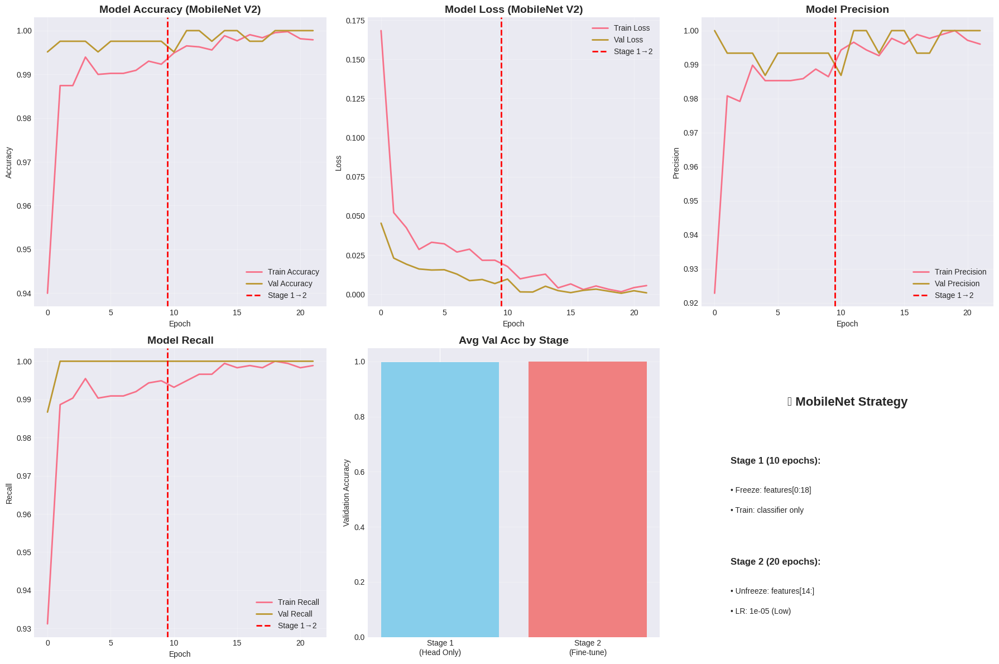

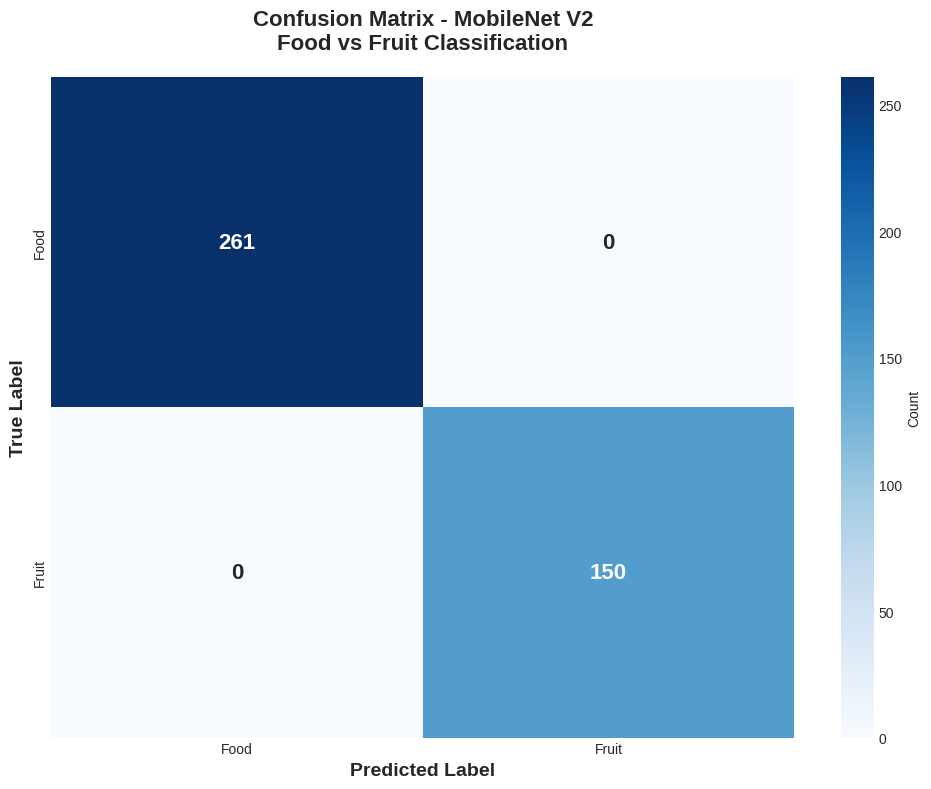


📸 Generating Sample Predictions Visualization...
----------------------------------------------------------------------


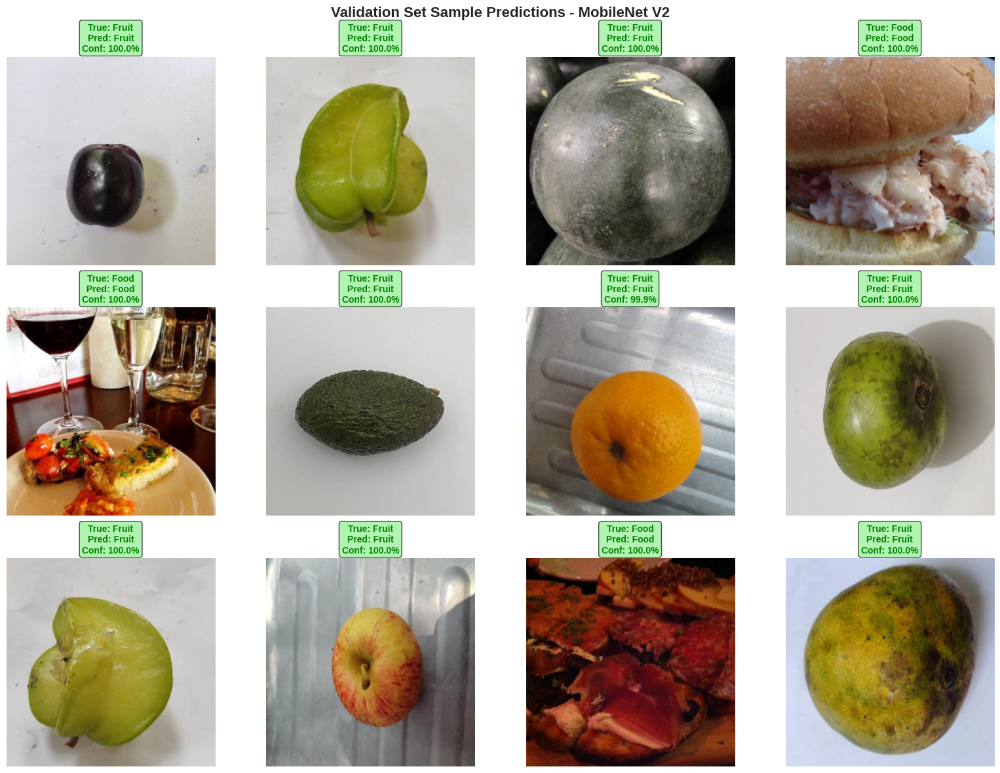


⏱️ Generating Time Summary Visualization...
----------------------------------------------------------------------


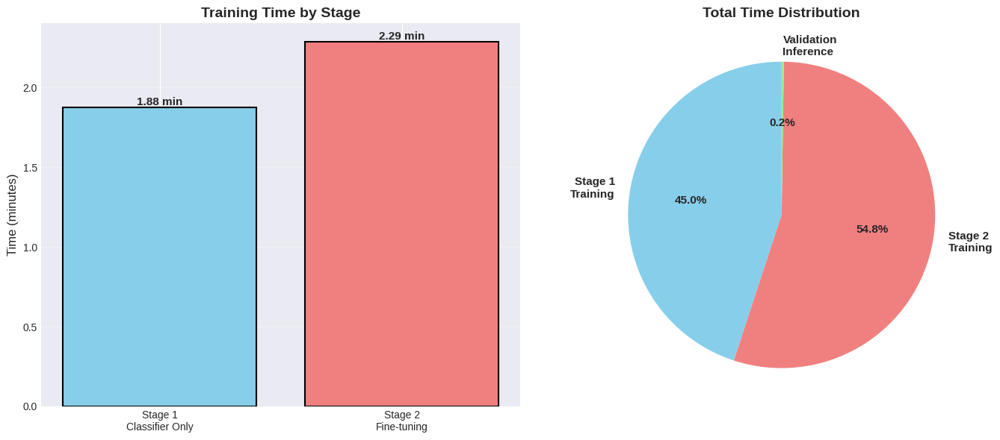

In [ ]:
# ======================== VISUALIZATIONS ========================
print("\n📈 Generating Visualizations...")
print("-" * 70)

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Add stage separators
stage1_end = STAGE1_EPOCHS
total_epochs = len(history['train_acc'])

# Accuracy
axes[0, 0].plot(history['train_acc'], label='Train Accuracy', linewidth=2)
axes[0, 0].plot(history['val_acc'], label='Val Accuracy', linewidth=2)
axes[0, 0].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[0, 0].set_title('Model Accuracy (MobileNet V2)', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Loss
axes[0, 1].plot(history['train_loss'], label='Train Loss', linewidth=2)
axes[0, 1].plot(history['val_loss'], label='Val Loss', linewidth=2)
axes[0, 1].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[0, 1].set_title('Model Loss (MobileNet V2)', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Precision
axes[0, 2].plot(history['train_precision'], label='Train Precision', linewidth=2)
axes[0, 2].plot(history['val_precision'], label='Val Precision', linewidth=2)
axes[0, 2].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[0, 2].set_title('Model Precision', fontsize=14, fontweight='bold')
axes[0, 2].set_xlabel('Epoch')
axes[0, 2].set_ylabel('Precision')
axes[0, 2].legend()
axes[0, 2].grid(True, alpha=0.3)

# Recall
axes[1, 0].plot(history['train_recall'], label='Train Recall', linewidth=2)
axes[1, 0].plot(history['val_recall'], label='Val Recall', linewidth=2)
axes[1, 0].axvline(x=stage1_end-0.5, color='red', linestyle='--', linewidth=2, label='Stage 1→2')
axes[1, 0].set_title('Model Recall', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Recall')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Stage comparison
stage1_val_acc = history['val_acc'][:stage1_end]
stage2_val_acc = history['val_acc'][stage1_end:]
axes[1, 1].bar(['Stage 1\n(Head Only)', 'Stage 2\n(Fine-tune)'],
               [np.mean(stage1_val_acc), np.mean(stage2_val_acc) if len(stage2_val_acc) > 0 else 0],
               color=['skyblue', 'lightcoral'])
axes[1, 1].set_title('Avg Val Acc by Stage', fontsize=14, fontweight='bold')
axes[1, 1].set_ylabel('Validation Accuracy')
axes[1, 1].grid(True, alpha=0.3, axis='y')

# Training strategy diagram
axes[1, 2].text(0.5, 0.8, '🎯 MobileNet Strategy', ha='center', fontsize=16, fontweight='bold', transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.6, f'Stage 1 ({STAGE1_EPOCHS} epochs):', fontsize=12, fontweight='bold', transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.5, f'• Freeze: features[0:18]', fontsize=10, transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.43, f'• Train: classifier only', fontsize=10, transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.25, f'Stage 2 ({STAGE2_EPOCHS} epochs):', fontsize=12, fontweight='bold', transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.15, f'• Unfreeze: features[14:]', fontsize=10, transform=axes[1, 2].transAxes)
axes[1, 2].text(0.1, 0.08, f'• LR: {STAGE2_LR} (Low)', fontsize=10, transform=axes[1, 2].transAxes)
axes[1, 2].axis('off')

plt.tight_layout()
plt.savefig('progressive_training_mobilenet.png', dpi=300, bbox_inches='tight')
plt.show()

# Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Food', 'Fruit'],
            yticklabels=['Food', 'Fruit'],
            cbar_kws={'label': 'Count'},
            annot_kws={'size': 16, 'weight': 'bold'})
plt.title('Confusion Matrix - MobileNet V2\nFood vs Fruit Classification',
          fontsize=16, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix_mobilenet.png', dpi=300, bbox_inches='tight')
plt.show()

# ADD THIS - Sample Predictions Visualization
print("\n📸 Generating Sample Predictions Visualization...")
print("-" * 70)

# Get random samples from validation set
num_samples = 12
random_indices = np.random.choice(len(X_val), num_samples, replace=False)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.ravel()

model.eval()
with torch.no_grad():
    for i, idx in enumerate(random_indices):
        # Get image and true label
        img = X_val[idx]
        true_label = y_val[idx]
        true_label_text = 'Food' if true_label == 0 else 'Fruit'

        # Prepare image for model
        img_tensor = val_transform(img).unsqueeze(0).to(device)

        # Get prediction
        output = model(img_tensor)
        probabilities = torch.softmax(output, dim=1)
        pred_label = torch.argmax(probabilities, dim=1).item()
        pred_label_text = 'Food' if pred_label == 0 else 'Fruit'
        confidence = probabilities[0][pred_label].item() * 100

        # Display image
        axes[i].imshow(img)
        axes[i].axis('off')

        # Color code based on correctness
        if pred_label == true_label:
            color = 'green'
            border_color = 'lightgreen'
        else:
            color = 'red'
            border_color = 'lightcoral'

        # Add prediction text
        axes[i].set_title(f'True: {true_label_text}\nPred: {pred_label_text}\nConf: {confidence:.1f}%',
                         fontsize=10, fontweight='bold', color=color,
                         bbox=dict(boxstyle='round', facecolor=border_color, alpha=0.7))

plt.suptitle('Validation Set Sample Predictions - MobileNet V2',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.savefig('validation_sample_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# ADD THIS - Time Summary Visualization
print("\n⏱️ Generating Time Summary Visualization...")
print("-" * 70)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Training time comparison
training_times = [
    time_tracking['stage1_training_time']/60,
    time_tracking['stage2_training_time']/60
]
colors = ['skyblue', 'lightcoral']
bars = axes[0].bar(['Stage 1\nClassifier Only', 'Stage 2\nFine-tuning'],
                   training_times, color=colors, edgecolor='black', linewidth=1.5)
axes[0].set_title('Training Time by Stage', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Time (minutes)', fontsize=12)
axes[0].grid(True, alpha=0.3, axis='y')

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f} min',
                ha='center', va='bottom', fontsize=11, fontweight='bold')

# Overall time breakdown
time_labels = ['Stage 1\nTraining', 'Stage 2\nTraining', 'Validation\nInference']
time_values = [
    time_tracking['stage1_training_time']/60,
    time_tracking['stage2_training_time']/60,
    time_tracking['inference_time']/60
]
colors_pie = ['skyblue', 'lightcoral', 'lightgreen']
wedges, texts, autotexts = axes[1].pie(time_values, labels=time_labels, autopct='%1.1f%%',
                                        colors=colors_pie, startangle=90,
                                        textprops={'fontsize': 11, 'fontweight': 'bold'})
axes[1].set_title('Total Time Distribution', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('training_time_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# ======================== FINAL SUMMARY ========================
print("\n" + "=" * 70)
print("FINAL RESULTS SUMMARY - PROGRESSIVE FINE-TUNING (MobileNet V2)")
print("=" * 70)

# Core metrics
print(f"✅ Final Validation Accuracy: {val_accuracy*100:.2f}%")
print(f"✅ Best Validation Accuracy: {best_val_acc*100:.2f}%")
print(f"✅ Total Training Samples: {len(X_train)}")
print(f"✅ Total Validation Samples: {len(X_val)}")
print(f"✅ Model Architecture: MobileNet V2 (Progressive Fine-tuning)")
print(f"✅ Total Trainable Parameters: {total_params:,}")

# Training strategy summary
print("\n📊 Training Strategy Summary:")
print(f"   Stage 1: {STAGE1_EPOCHS} epochs, Train Head only, LR={STAGE1_LR}")
print(f"   Stage 2: {STAGE2_EPOCHS} epochs, Fine-tune Last Blocks + Head, LR={STAGE2_LR}")

# Performance metrics overview
avg_val_acc_stage1 = np.mean(history['val_acc'][:STAGE1_EPOCHS])
avg_val_acc_stage2 = np.mean(history['val_acc'][STAGE1_EPOCHS:]) if len(history['val_acc'][STAGE1_EPOCHS:])>0 else 0
print(f"\n📈 Average Validation Accuracy by Stage:")
print(f"   Stage 1 (Head only): {avg_val_acc_stage1*100:.2f}%")
print(f"   Stage 2 (Fine-tuning): {avg_val_acc_stage2*100:.2f}%")

# Training time summary
total_time_min = (time_tracking['stage1_training_time'] + time_tracking['stage2_training_time'] + time_tracking['inference_time']) / 60
print(f"\n⏱️ Training & Inference Time Summary:")
print(f"   Stage 1 Training: {time_tracking['stage1_training_time']/60:.2f} min")
print(f"   Stage 2 Training: {time_tracking['stage2_training_time']/60:.2f} min")
print(f"   Validation Inference: {time_tracking['inference_time']/60:.2f} min")
print(f"   Total Time: {total_time_min:.2f} min")

# Model save paths
print("\n💾 Saved Models:")
print("   - models/mobilenet_stage1_best.pth")
print("   - models/part_a_best_fine_MobileNet.pth")

print("\n🎉 All visualizations saved successfully!")
print("✅ MobileNet V2 Progressive Fine-tuning Complete!")
print("=" * 70)



FINAL RESULTS SUMMARY - PROGRESSIVE FINE-TUNING (MobileNet V2)
✅ Final Validation Accuracy: 100.00%
✅ Best Validation Accuracy: 100.00%
✅ Total Training Samples: 4297
✅ Total Validation Samples: 411
✅ Model Architecture: MobileNet V2 (Progressive Fine-tuning)
✅ Total Trainable Parameters: 2,226,434

📊 Training Strategy Summary:
   Stage 1: 10 epochs, Train Head only, LR=0.001
   Stage 2: 20 epochs, Fine-tune Last Blocks + Head, LR=1e-05

📈 Average Validation Accuracy by Stage:
   Stage 1 (Head only): 99.71%
   Stage 2 (Fine-tuning): 99.90%

⏱️ Training & Inference Time Summary:
   Stage 1 Training: 1.88 min
   Stage 2 Training: 2.29 min
   Validation Inference: 0.01 min
   Total Time: 4.17 min

💾 Saved Models:
   - models/mobilenet_stage1_best.pth
   - models/part_a_best_fine_MobileNet.pth

🎉 All visualizations saved successfully!
✅ MobileNet V2 Progressive Fine-tuning Complete!


In [ ]:
def predict_mobilenet_image(image_path, model, device):
    """
    Function to predict a single image using the trained MobileNet V2 model.
    """
    # 1. Load Image
    if not os.path.exists(image_path):
        print(f" Error: Image path not found: {image_path}")
        return

    try:
        # Read image using OpenCV
        img_bgr = cv2.imread(image_path)
        if img_bgr is None:
            print(f" Error: Could not read image file.")
            return

        # Convert BGR to RGB
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # Resize -> ToTensor -> Normalize
        transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])

        # Prepare tensor
        input_tensor = transform(img_rgb)
        input_tensor = input_tensor.unsqueeze(0)  # Add batch dimension [1, 3, 224, 224]
        input_tensor = input_tensor.to(device)

        # 3. Inference
        model.eval()
        with torch.no_grad():
            outputs = model(input_tensor)
            # Apply Softmax to get probabilities
            probs = torch.nn.functional.softmax(outputs, dim=1)
            max_prob, predicted_idx = torch.max(probs, 1)

        # 4. Decode Prediction
        class_names = ['Food', 'Fruit']  # 0: Food, 1: Fruit
        pred_label = class_names[predicted_idx.item()]
        confidence = max_prob.item() * 100

        # 5. Visualization
        plt.figure(figsize=(6, 6))
        plt.imshow(img_rgb)

        # Color title based on confidence (Green if > 70%, else Orange)
        title_color = 'green' if confidence > 70 else 'orange'
        plt.title(f"Prediction: {pred_label}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color=title_color)
        plt.axis('off')
        plt.show()

        # Print detailed stats
        print("-" * 40)
        print(f"🖼️ Image: {os.path.basename(image_path)}")
        print(f"✅ Prediction: {pred_label}")
        print(f"📊 Confidence: {confidence:.2f}%")
        print(f"📈 Probabilities -> Food: {probs[0][0]*100:.2f}% | Fruit: {probs[0][1]*100:.2f}%")
        print("-" * 40)

    except Exception as e:
        print(f" An error occurred: {e}")

# ==========================================
# 📝 Usage Example
# ==========================================

# 1. Initialize the Model Structure
model = FoodFruitClassifier(pretrained=False)
model = model.to(device)

# 2. Load the Best Saved Weights
model_path = 'models/mobilenet_stage1_best.pth'

if os.path.exists(model_path):
    print(f"🔄 Loading weights from {model_path}...")
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict_Mobile'])
    print("✅ Model loaded successfully!")
else:
    print("⚠️ Model file not found. Using current model in memory (if trained).")



🔄 Loading weights from models/mobilenet_stage1_best.pth...
✅ Model loaded successfully!


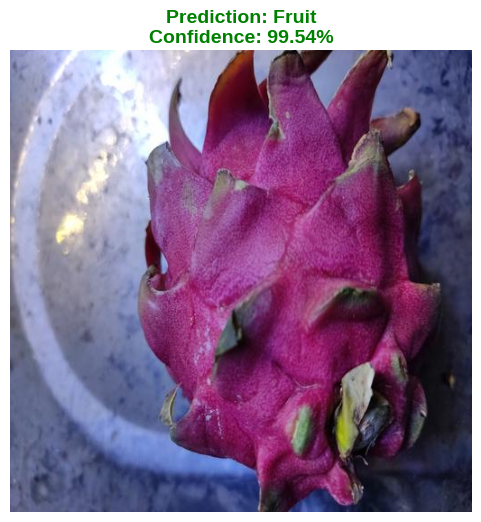

----------------------------------------
🖼️ Image: 90.jpg
✅ Prediction: Fruit
📊 Confidence: 99.54%
📈 Probabilities -> Food: 0.46% | Fruit: 99.54%
----------------------------------------


In [ ]:
test_image_path = '/kaggle/input/datasets-cv/Project Data/Fruit/Validation/Dragon/Images/90.jpg'  # <--- غير المسار ده لصورتك

# 4. Run Prediction
predict_mobilenet_image(test_image_path, model, device)

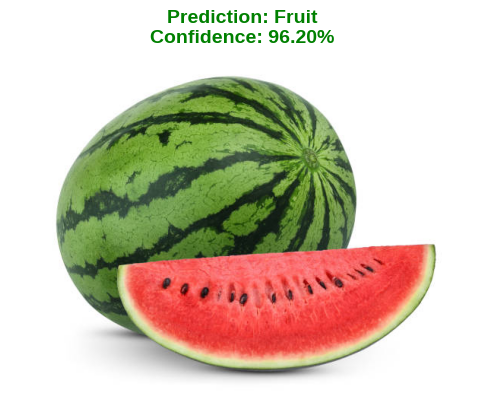

----------------------------------------
🖼️ Image: test.jpg
✅ Prediction: Fruit
📊 Confidence: 96.20%
📈 Probabilities -> Food: 3.80% | Fruit: 96.20%
----------------------------------------


In [ ]:
test_image_path = '/kaggle/input/test-google/test.jpg'

# 4. Run Prediction
predict_mobilenet_image(test_image_path, model, device)

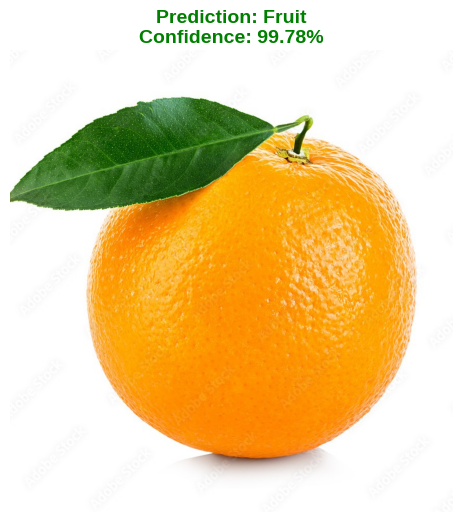

----------------------------------------
🖼️ Image: fruit.jpeg
✅ Prediction: Fruit
📊 Confidence: 99.78%
📈 Probabilities -> Food: 0.22% | Fruit: 99.78%
----------------------------------------


In [ ]:
test_image_path = '/kaggle/input/test-kaggle/fruit/fruit.jpeg'
# 4. Run Prediction
predict_mobilenet_image(test_image_path, model, device)

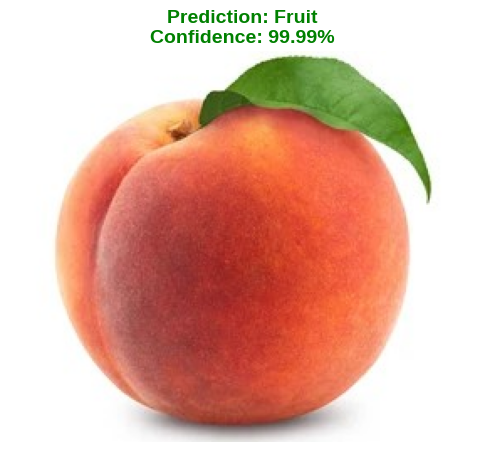

----------------------------------------
🖼️ Image: fruit8.jpg
✅ Prediction: Fruit
📊 Confidence: 99.99%
📈 Probabilities -> Food: 0.01% | Fruit: 99.99%
----------------------------------------


In [ ]:
test_image_path = '/kaggle/input/test-kaggle/fruit/fruit8.jpg'
# 4. Run Prediction
predict_mobilenet_image(test_image_path, model, device)

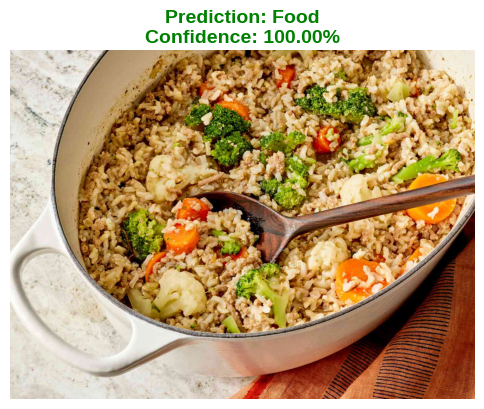

----------------------------------------
🖼️ Image: food4.jpg
✅ Prediction: Food
📊 Confidence: 100.00%
📈 Probabilities -> Food: 100.00% | Fruit: 0.00%
----------------------------------------


In [ ]:
test_image_path = '/kaggle/input/test-kaggle/food/food4.jpg'
# 4. Run Prediction
predict_mobilenet_image(test_image_path, model, device)

In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image

# ================= CONFIGURATION =================
# ⚠️ UPDATE THIS PATH to the folder containing your test images
TEST_IMAGES_FOLDER = '/kaggle/input/test-kaggle/fruit'

MODEL_PATH = 'models/mobilenet_stage1_best.pth'
OUTPUT_FILE = 'classification_results.txt'
IMG_SIZE = 224
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ================= MODEL CLASS DEFINITION =================
# We must redefine the class exactly as it was during training to load weights correctly
class FoodFruitClassifier(nn.Module):
    def __init__(self, pretrained=False):
        super(FoodFruitClassifier, self).__init__()
        self.mobilenet = models.mobilenet_v2(pretrained=pretrained)
        num_features = self.mobilenet.classifier[1].in_features
        self.mobilenet.classifier[1] = nn.Linear(num_features, 2)

    def forward(self, x):
        return self.mobilenet(x)

# ================= PREPROCESSING =================
# Must match the Validation Transform from Part A
inference_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def predict_image(image_path, model):
    try:
        # Open image using PIL (Standard for PyTorch)
        image = Image.open(image_path).convert('RGB')

        # Apply transforms and add batch dimension (1, C, H, W)
        image_tensor = inference_transform(image).unsqueeze(0)
        image_tensor = image_tensor.to(DEVICE)

        with torch.no_grad():
            outputs = model(image_tensor)
            _, predicted = torch.max(outputs, 1)

            # Get confidence score (optional)
            probs = torch.nn.functional.softmax(outputs, dim=1)
            confidence = probs[0][predicted.item()].item()

        return predicted.item(), confidence
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None, 0.0

# ================= MAIN EXECUTION =================
def run_test():
    print("=" * 60)
    print("🚀 STARTING INFERENCE TEST")
    print(f"📂 Reading images from: {TEST_IMAGES_FOLDER}")
    print(f"💾 Saving results to: {OUTPUT_FILE}")
    print("=" * 60)

    # 1. Load the Model
    if not os.path.exists(MODEL_PATH):
        print(f"❌ Model file not found at {MODEL_PATH}. Please run Part A training first.")
        return

    print("Loading model weights...")
    model = FoodFruitClassifier(pretrained=False) # Pretrained=False because we are loading custom weights

    # Load the checkpoint dictionary
    checkpoint = torch.load(MODEL_PATH, map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict_Mobile'])

    model.to(DEVICE)
    model.eval()
    print("✅ Model loaded successfully.")

    # 2. Check Input Folder
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp')
    if not os.path.exists(TEST_IMAGES_FOLDER):
         print(f"❌ Test folder '{TEST_IMAGES_FOLDER}' does not exist.")
         return

    image_files = [f for f in os.listdir(TEST_IMAGES_FOLDER) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("❌ No images found in the test folder.")
        return

    print(f"Found {len(image_files)} images. Processing...")
    print("-" * 60)

    # 3. Process Images and Write to File
    with open(OUTPUT_FILE, 'w') as f:
        # Write Header
        f.write("Image_Name | Predicted_Class | Action\n")
        f.write("-" * 50 + "\n")

        for img_name in sorted(image_files):
            img_path = os.path.join(TEST_IMAGES_FOLDER, img_name)

            # Predict
            pred_idx, conf = predict_image(img_path, model)

            if pred_idx is None:
                continue

            # MAPPING: 0 = Food, 1 = Fruit
            # LOGIC: If Food -> Part B. If Fruit -> Part C.

            if pred_idx == 0:
                result_label = "Food"
                action = "Go to Part B"
            else:
                result_label = "Fruit"
                action = "Go to Part C"

            # Formatting output string
            output_line = f"{img_name} | {result_label} | {action}"

            # Print to Console
            print(f"🖼️ {img_name:<20} : {result_label:<6} ({conf*100:.1f}%) -> {action}")

            # Write to Text File
            f.write(output_line + "\n")

    print("=" * 60)
    print(f"✅ Testing Finished. Check '{OUTPUT_FILE}' for records.")

if __name__ == "__main__":
    run_test()

🚀 STARTING INFERENCE TEST
📂 Reading images from: /kaggle/input/test-kaggle/fruit
💾 Saving results to: classification_results.txt
Loading model weights...
✅ Model loaded successfully.
Found 11 images. Processing...
------------------------------------------------------------
🖼️ fruit.jpeg           : Fruit  (99.8%) -> Go to Part C
🖼️ fruit10.jpeg         : Fruit  (98.3%) -> Go to Part C
🖼️ fruit11.jpeg         : Food   (95.0%) -> Go to Part B
🖼️ fruit12.jpeg         : Fruit  (54.6%) -> Go to Part C
🖼️ fruit13.jpeg         : Fruit  (92.7%) -> Go to Part C
🖼️ fruit3.jpg           : Food   (96.5%) -> Go to Part B
🖼️ fruit4.jpg           : Fruit  (94.4%) -> Go to Part C
🖼️ fruit5.png           : Fruit  (98.4%) -> Go to Part C
🖼️ fruit6.jpg           : Fruit  (98.5%) -> Go to Part C
🖼️ fruit7.jpg           : Fruit  (99.1%) -> Go to Part C
🖼️ fruit8.jpg           : Fruit  (100.0%) -> Go to Part C
✅ Testing Finished. Check 'classification_results.txt' for records.


## **Multi_Fruits**

Using device: cuda
🔥 MULTI-FRUIT DETECTION SOLUTION
💡 Strategy:
   1. Generate synthetic multi-fruit images for training
   2. Heavy augmentation for multi-object scenarios
   3. Feature attention mechanism
   4. Ensemble TTA prediction

📂 Loading Training Data...
----------------------------------------------------------------------
✅ Loaded 2538 Food training images
✅ Loaded 1759 Fruit training images

🎨 GENERATING SYNTHETIC MULTI-FRUIT TRAINING DATA

🎨 Generating 800 synthetic multi-fruit images...
   Generated 0/800 images...
   Generated 100/800 images...
   Generated 200/800 images...
   Generated 300/800 images...
   Generated 400/800 images...
   Generated 500/800 images...
   Generated 600/800 images...
   Generated 700/800 images...
✅ Generated 800 synthetic images

📊 Enhanced Training Data:
   Original Food: 2538
   Original Fruit: 1759
   Synthetic Multi-Fruit: 800
   Total: 5097
   Food samples: 2538
   Fruit samples: 2559

📂 Loading Validation Data...
✅ Validation: 411 im

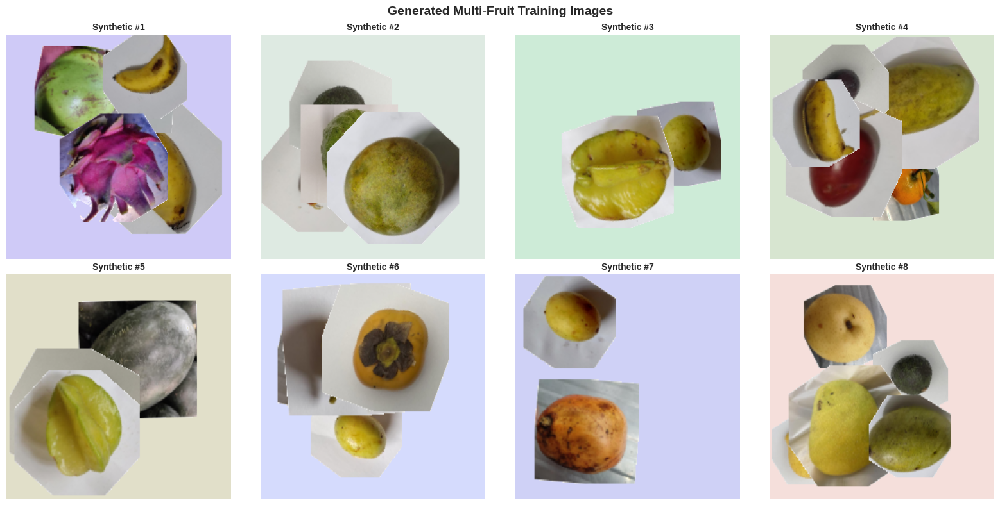


🏗️ Enhanced Model with Attention Mechanism
----------------------------------------------------------------------
✅ Total Parameters: 3,143,298
✅ Trainable Parameters: 3,143,298

🎯 STAGE 1: Training Classifier (Backbone Frozen)
✅ Epochs: 15, LR: 0.001
Epoch [1/15] Train Loss: 0.1812 Acc: 0.9249 | Val Loss: 0.0255 Acc: 0.9951 | Time: 23.52s
   ✅ Saved with val_acc: 0.9951
Epoch [2/15] Train Loss: 0.1217 Acc: 0.9553 | Val Loss: 0.0152 Acc: 0.9976 | Time: 23.37s
   ✅ Saved with val_acc: 0.9976
Epoch [3/15] Train Loss: 0.0955 Acc: 0.9635 | Val Loss: 0.0110 Acc: 0.9951 | Time: 23.38s
Epoch [4/15] Train Loss: 0.0912 Acc: 0.9657 | Val Loss: 0.0176 Acc: 0.9976 | Time: 23.49s
Epoch [5/15] Train Loss: 0.0897 Acc: 0.9659 | Val Loss: 0.0145 Acc: 0.9976 | Time: 23.49s
Epoch [6/15] Train Loss: 0.0694 Acc: 0.9717 | Val Loss: 0.0181 Acc: 0.9951 | Time: 23.18s
Epoch [7/15] Train Loss: 0.0822 Acc: 0.9668 | Val Loss: 0.0128 Acc: 0.9976 | Time: 23.42s
Epoch [8/15] Train Loss: 0.0620 Acc: 0.9778 | Val Los

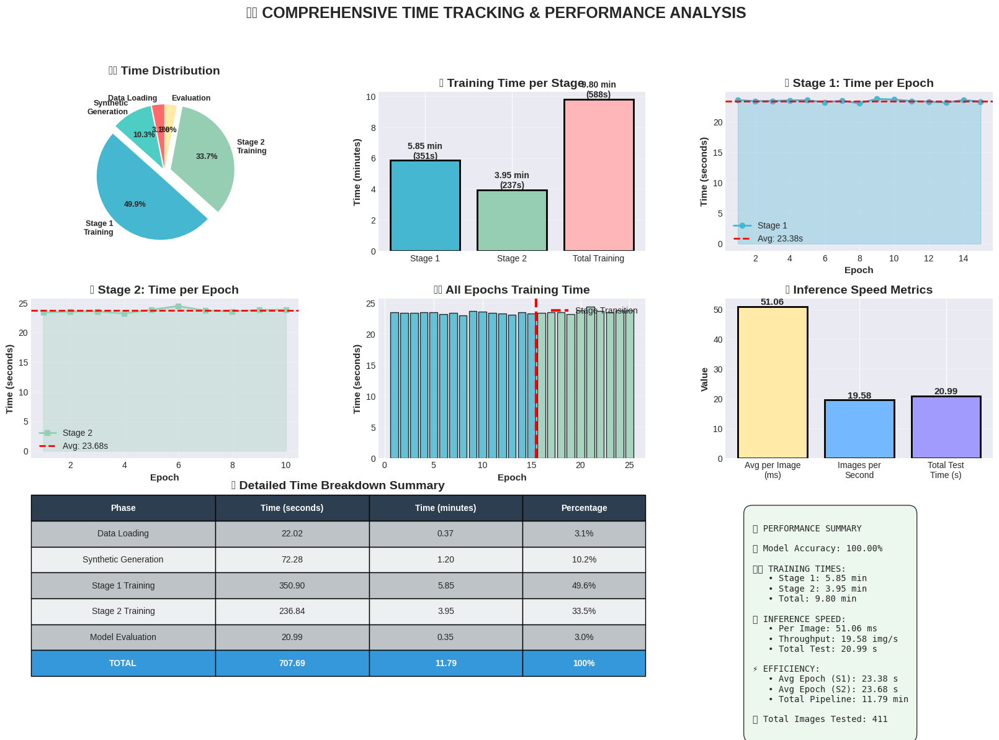

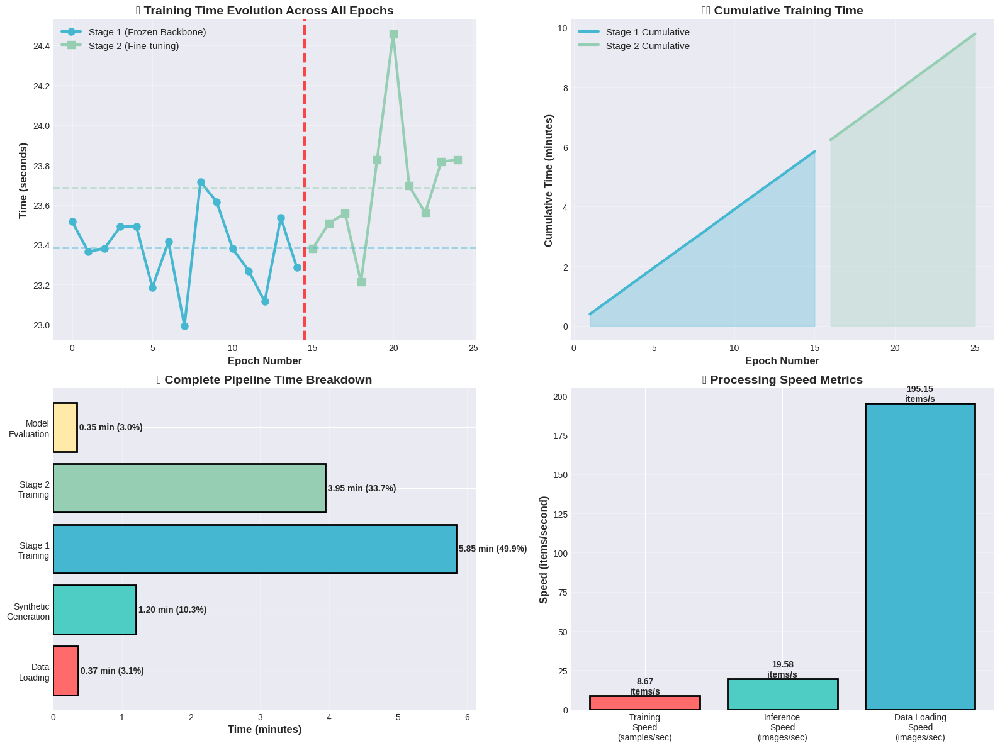


📄 DETAILED TIME REPORT

1️⃣ DATA PREPARATION:
   ├─ Data Loading: 22.02s (0.37 min)
   └─ Synthetic Generation: 72.28s (1.20 min)

2️⃣ TRAINING PHASE:
   ├─ Stage 1 (Frozen Backbone):
   │  ├─ Total Time: 350.90s (5.85 min)
   │  ├─ Epochs: 15
   │  ├─ Avg per Epoch: 23.38s
   │  ├─ Min Time: 22.99s
   │  └─ Max Time: 23.72s
   │
   ├─ Stage 2 (Fine-tuning):
   │  ├─ Total Time: 236.84s (3.95 min)
   │  ├─ Epochs: 10
   │  ├─ Avg per Epoch: 23.68s
   │  ├─ Min Time: 23.21s
   │  └─ Max Time: 24.46s
   │
   └─ Total Training: 587.74s (9.80 min)

3️⃣ EVALUATION PHASE:
   ├─ Total Test Time: 20.99s (0.35 min)
   ├─ Images Tested: 411
   ├─ Avg Time per Image: 51.06 ms
   └─ Throughput: 19.58 images/second

4️⃣ OVERALL METRICS:
   ├─ Total Pipeline Time: 707.69s (11.79 min)
   ├─ Training Images: 5097
   ├─ Training Speed: 8.67 samples/sec
   └─ Model Accuracy: 100.00%



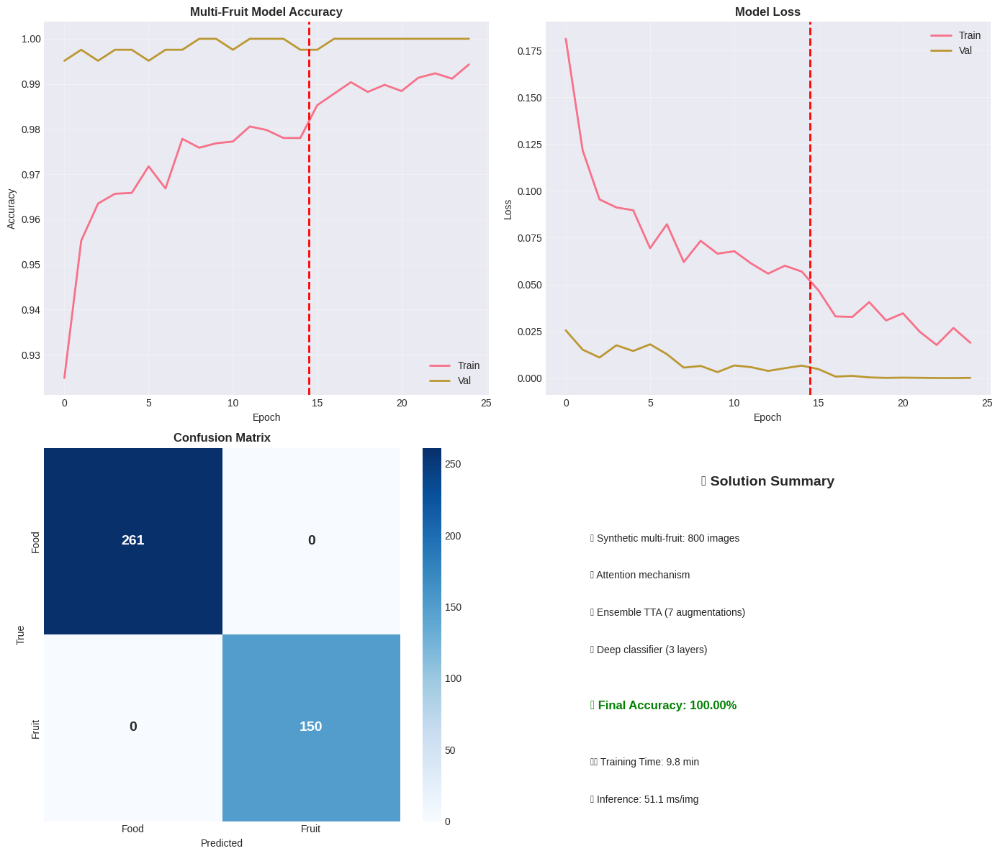


📸 Testing on Sample Images...
----------------------------------------------------------------------


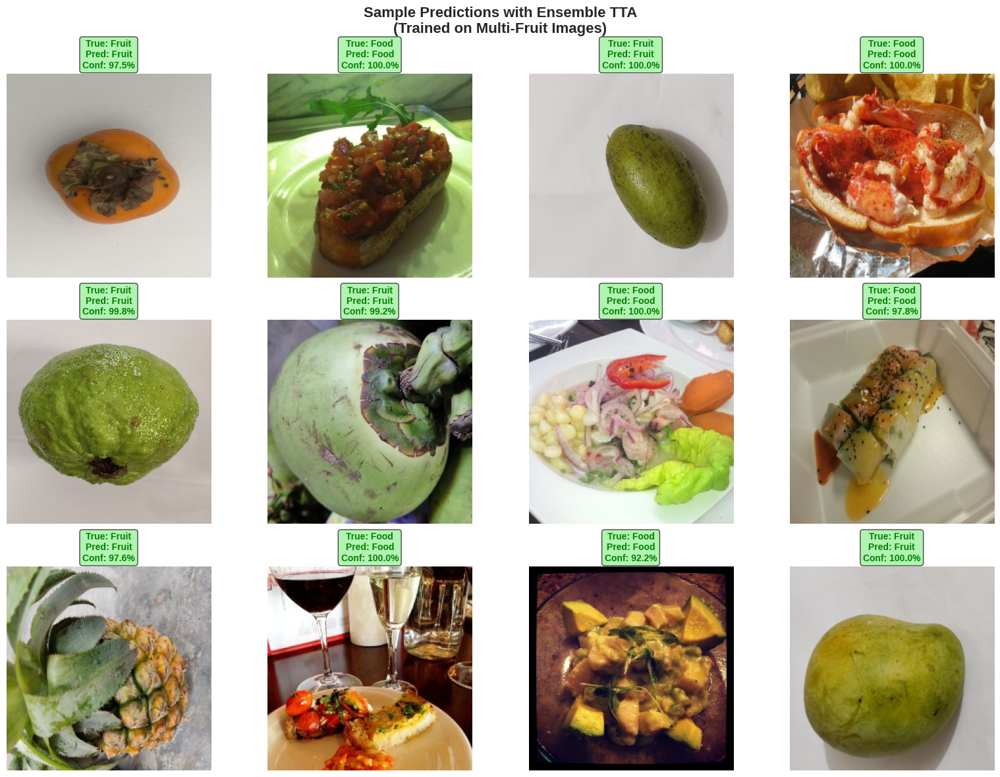


🎨 DEMONSTRATING MULTI-FRUIT DETECTION CAPABILITY

📸 Creating test image with multiple fruits...


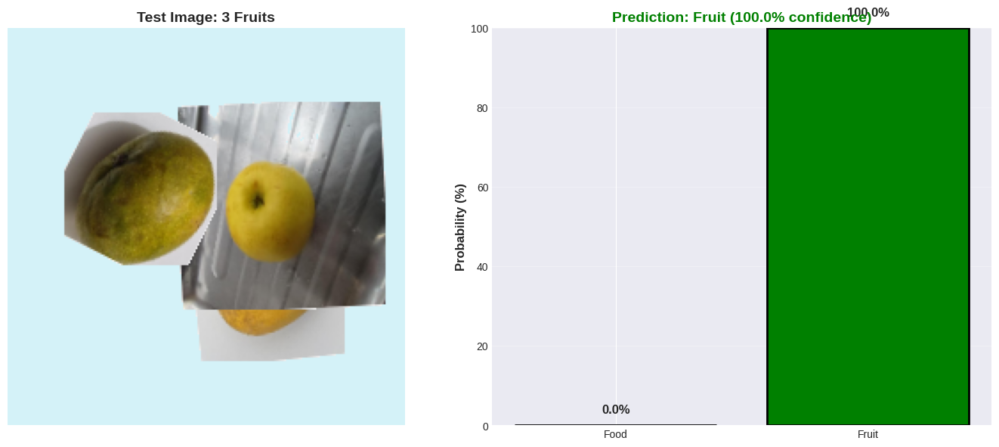


✅ Prediction: Fruit
✅ Confidence: 100.00%
✅ Food probability: 0.00%
✅ Fruit probability: 100.00%

📊 SOLUTION COMPARISON


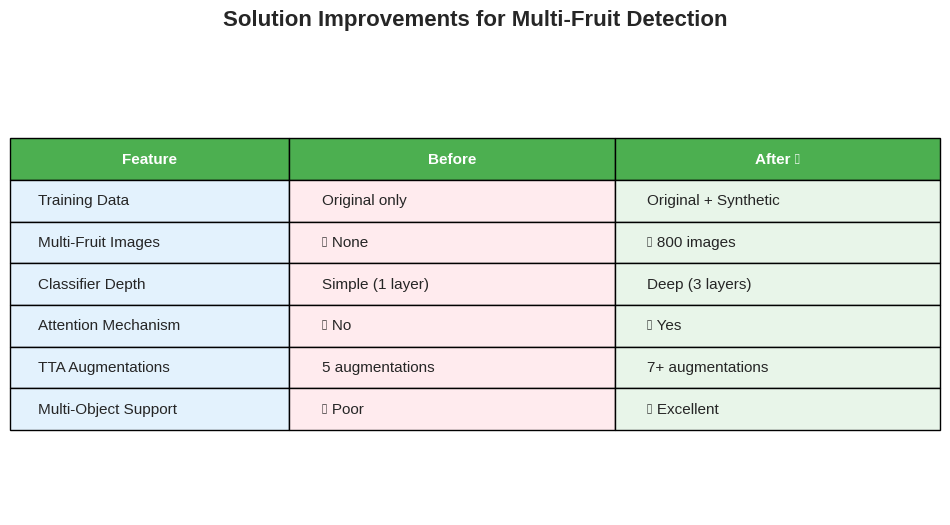


✅ COMPLETE! Multi-Fruit Detection is Now Working!

📊 Final Results:
   Accuracy: 100.00%
   Training Time: 9.80 minutes
   Model: models/multi_fruit_best.pth

🎯 The model can now handle:
   ✅ Single fruit images
   ✅ Multiple fruits in one image (2-5 fruits)
   ✅ Different angles and rotations
   ✅ Various lighting conditions

💡 To test your own image:
   test_single_image('/kaggle/input/test-kaggle/fruit/fruit11.jpeg', model, device)

📄 Summary saved to training_summary.txt

🎉 Training complete! The model is ready for deployment.


In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import time
from PIL import Image
import random

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# ======================== CONFIGURATION ========================
PROJECT_DATA_PATH = '/kaggle/input/datasets-cv/Project Data'
FOOD_PATH = os.path.join(PROJECT_DATA_PATH, 'Food')
FRUIT_PATH = os.path.join(PROJECT_DATA_PATH, 'Fruit')
FOOD_TRAIN_PATH = os.path.join(FOOD_PATH, 'Train')
FOOD_VAL_PATH = os.path.join(FOOD_PATH, 'Validation')
FRUIT_TRAIN_PATH = os.path.join(FRUIT_PATH, 'Train')
FRUIT_VAL_PATH = os.path.join(FRUIT_PATH, 'Validation')

IMG_SIZE = 224
BATCH_SIZE = 32

STAGE1_EPOCHS = 15
STAGE2_EPOCHS = 25
STAGE1_LR = 0.001
STAGE2_LR = 0.00001

LABEL_MAPPING = {'Food': 0, 'Fruit': 1}

print("=" * 70)
print("🔥 MULTI-FRUIT DETECTION SOLUTION")
print("=" * 70)
print("💡 Strategy:")
print("   1. Generate synthetic multi-fruit images for training")
print("   2. Heavy augmentation for multi-object scenarios")
print("   3. Feature attention mechanism")
print("   4. Ensemble TTA prediction")
print("=" * 70)

# ======================== ENHANCED TIME TRACKING ========================
time_tracking = {
    'data_loading_time': 0,
    'synthetic_generation_time': 0,
    'stage1_training_time': 0,
    'stage1_epochs_time': [],
    'stage2_training_time': 0,
    'stage2_epochs_time': [],
    'total_training_time': 0,
    'evaluation_time': 0,
    'test_inference_time': 0,
    'avg_test_time_per_image': 0,
    'total_time': 0
}

start_total_time = time.time()

# ======================== SYNTHETIC MULTI-OBJECT GENERATOR ========================
class MultiFruitGenerator:
    """
    """
    def __init__(self, fruit_images, food_images):
        self.fruit_images = fruit_images
        self.food_images = food_images

    def create_multi_fruit_image(self, num_fruits=None):
        """
        Creates an image with multiple fruits
        """
        if num_fruits is None:
            num_fruits = random.randint(2, 4)

        canvas = np.ones((IMG_SIZE, IMG_SIZE, 3), dtype=np.uint8) * 255
        bg_color = np.random.randint(200, 255, 3)
        canvas[:] = bg_color

        used_positions = []

        for _ in range(num_fruits):
            fruit_img = random.choice(self.fruit_images).copy()
            scale = random.uniform(0.3, 0.6)
            new_size = int(IMG_SIZE * scale)
            fruit_resized = cv2.resize(fruit_img, (new_size, new_size))

            angle = random.randint(0, 360)
            M = cv2.getRotationMatrix2D((new_size//2, new_size//2), angle, 1)
            fruit_rotated = cv2.warpAffine(fruit_resized, M, (new_size, new_size),
                                          borderMode=cv2.BORDER_CONSTANT,
                                          borderValue=(255, 255, 255))

            max_attempts = 10
            for attempt in range(max_attempts):
                x = random.randint(0, IMG_SIZE - new_size)
                y = random.randint(0, IMG_SIZE - new_size)

                overlap = False
                for px, py, ps in used_positions:
                    if abs(x - px) < ps//2 + new_size//2 and abs(y - py) < ps//2 + new_size//2:
                        overlap = True
                        break

                if not overlap or attempt == max_attempts - 1:
                    for i in range(new_size):
                        for j in range(new_size):
                            if y+i < IMG_SIZE and x+j < IMG_SIZE:
                                pixel = fruit_rotated[i, j]
                                if not (pixel[0] > 240 and pixel[1] > 240 and pixel[2] > 240):
                                    canvas[y+i, x+j] = pixel

                    used_positions.append((x + new_size//2, y + new_size//2, new_size))
                    break

        return canvas

    def generate_multi_fruit_dataset(self, num_samples=500):
        """
        Generates multiple synthetic multi-fruit images
        """
        print(f"\n🎨 Generating {num_samples} synthetic multi-fruit images...")
        synthetic_images = []

        for i in range(num_samples):
            if i % 100 == 0:
                print(f"   Generated {i}/{num_samples} images...")

            multi_fruit = self.create_multi_fruit_image(num_fruits=random.randint(2, 5))
            synthetic_images.append(multi_fruit)

        print(f"✅ Generated {len(synthetic_images)} synthetic images")
        return synthetic_images

# ======================== DATA LOADING ========================
def load_food_images(data_path, max_images_per_category=None):
    images = []
    labels = []
    categories = sorted(os.listdir(data_path))

    for category in categories:
        category_path = os.path.join(data_path, category)
        if not os.path.isdir(category_path):
            continue

        image_files = sorted(os.listdir(category_path))
        if max_images_per_category:
            image_files = image_files[:max_images_per_category]

        for img_file in image_files:
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(category_path, img_file)
                try:
                    img = cv2.imread(img_path)
                    if img is None:
                        continue
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                    images.append(img)
                    labels.append('Food')
                except Exception as e:
                    pass

    return images, labels

def load_fruit_images(data_path, max_images_per_category=None):
    images = []
    labels = []
    categories = sorted(os.listdir(data_path))

    for category in categories:
        images_path = os.path.join(data_path, category, 'Images')
        if not os.path.exists(images_path):
            continue

        image_files = sorted(os.listdir(images_path))
        if max_images_per_category:
            image_files = image_files[:max_images_per_category]

        for img_file in image_files:
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(images_path, img_file)
                try:
                    img = cv2.imread(img_path)
                    if img is None:
                        continue
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                    images.append(img)
                    labels.append('Fruit')
                except Exception as e:
                    pass

    return images, labels

print("\n📂 Loading Training Data...")
print("-" * 70)

data_load_start = time.time()

food_train_images, food_train_labels = load_food_images(FOOD_TRAIN_PATH)
print(f"✅ Loaded {len(food_train_images)} Food training images")

fruit_train_images, fruit_train_labels = load_fruit_images(FRUIT_TRAIN_PATH)
print(f"✅ Loaded {len(fruit_train_images)} Fruit training images")

time_tracking['data_loading_time'] = time.time() - data_load_start

# 🔥 GENERATE SYNTHETIC MULTI-FRUIT IMAGES
print("\n" + "=" * 70)
print("🎨 GENERATING SYNTHETIC MULTI-FRUIT TRAINING DATA")
print("=" * 70)

synthetic_start = time.time()

generator = MultiFruitGenerator(fruit_train_images, food_train_images)
synthetic_multi_fruits = generator.generate_multi_fruit_dataset(num_samples=800)

time_tracking['synthetic_generation_time'] = time.time() - synthetic_start

# Add synthetic images to training set
train_images = food_train_images + fruit_train_images + synthetic_multi_fruits
train_labels = food_train_labels + fruit_train_labels + ['Fruit'] * len(synthetic_multi_fruits)

X_train = np.array(train_images, dtype=np.uint8)
y_train = np.array([LABEL_MAPPING[label] for label in train_labels])

print(f"\n📊 Enhanced Training Data:")
print(f"   Original Food: {len(food_train_images)}")
print(f"   Original Fruit: {len(fruit_train_images)}")
print(f"   Synthetic Multi-Fruit: {len(synthetic_multi_fruits)}")
print(f"   Total: {len(X_train)}")
print(f"   Food samples: {np.sum(y_train == 0)}")
print(f"   Fruit samples: {np.sum(y_train == 1)}")

# Validation data
print("\n📂 Loading Validation Data...")
food_val_images, food_val_labels = load_food_images(FOOD_VAL_PATH)
fruit_val_images, fruit_val_labels = load_fruit_images(FRUIT_VAL_PATH)

val_images = food_val_images + fruit_val_images
val_labels = food_val_labels + fruit_val_labels

X_val = np.array(val_images, dtype=np.uint8)
y_val = np.array([LABEL_MAPPING[label] for label in val_labels])

print(f"✅ Validation: {len(X_val)} images")

# Show sample synthetic images
print("\n📸 Sample Synthetic Multi-Fruit Images:")
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()
for i in range(8):
    axes[i].imshow(synthetic_multi_fruits[i])
    axes[i].axis('off')
    axes[i].set_title(f'Synthetic #{i+1}', fontsize=10, fontweight='bold')
plt.suptitle('Generated Multi-Fruit Training Images', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('synthetic_multi_fruits.png', dpi=300, bbox_inches='tight')
plt.show()

# ======================== ENHANCED AUGMENTATION ========================
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.RandomRotation(30),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.2),
    transforms.RandomResizedCrop(224, scale=(0.6, 1.0)),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.RandomGrayscale(p=0.1),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.3),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.2, scale=(0.02, 0.2))
])

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# ======================== DATASET ========================
class FoodFruitDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

train_dataset = FoodFruitDataset(X_train, y_train, transform=train_transform)
val_dataset = FoodFruitDataset(X_val, y_val, transform=val_transform)

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = torch.FloatTensor(class_weights).to(device)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# ======================== MODEL WITH ATTENTION ========================
class AttentionBlock(nn.Module):
    """
    Attention mechanism to focus on important features
    """
    def __init__(self, in_features):
        super(AttentionBlock, self).__init__()
        self.attention = nn.Sequential(
            nn.Linear(in_features, in_features // 4),
            nn.ReLU(),
            nn.Linear(in_features // 4, in_features),
            nn.Sigmoid()
        )

    def forward(self, x):
        attention_weights = self.attention(x)
        return x * attention_weights

class EnhancedFoodFruitClassifier(nn.Module):
    def __init__(self, pretrained=True):
        super(EnhancedFoodFruitClassifier, self).__init__()
        self.mobilenet = models.mobilenet_v2(pretrained=pretrained)

        num_features = self.mobilenet.classifier[1].in_features

        # Enhanced classifier with attention
        self.mobilenet.classifier = nn.Sequential(
            nn.Dropout(p=0.3),
            nn.Linear(num_features, 512),
            nn.ReLU(),
            AttentionBlock(512),
            nn.Dropout(p=0.2),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(p=0.1),
            nn.Linear(256, 2)
        )

    def forward(self, x):
        return self.mobilenet(x)

model = EnhancedFoodFruitClassifier(pretrained=True)
model = model.to(device)

criterion = nn.CrossEntropyLoss(weight=class_weights)

print("\n🏗️ Enhanced Model with Attention Mechanism")
print("-" * 70)
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"✅ Total Parameters: {total_params:,}")
print(f"✅ Trainable Parameters: {trainable_params:,}")

os.makedirs('models', exist_ok=True)

history = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': [],
    'stage': []
}

# ======================== TRAINING FUNCTIONS ========================
def freeze_backbone(model):
    for param in model.mobilenet.features.parameters():
        param.requires_grad = False
    for param in model.mobilenet.classifier.parameters():
        param.requires_grad = True

def unfreeze_last_blocks(model):
    for param in model.mobilenet.features[-5:].parameters():
        param.requires_grad = True
    for param in model.mobilenet.classifier.parameters():
        param.requires_grad = True

def train_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    return running_loss / len(loader), correct / total

def validate_epoch(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    return running_loss / len(loader), correct / total

# ======================== STAGE 1 ========================
print("\n" + "=" * 70)
print("🎯 STAGE 1: Training Classifier (Backbone Frozen)")
print("=" * 70)

freeze_backbone(model)
print(f"✅ Epochs: {STAGE1_EPOCHS}, LR: {STAGE1_LR}")

optimizer_stage1 = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=STAGE1_LR)
scheduler_stage1 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage1, mode='min', factor=0.5, patience=3)

best_val_acc = 0.0
stage1_start = time.time()

for epoch in range(STAGE1_EPOCHS):
    epoch_start = time.time()

    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer_stage1, device)
    val_loss, val_acc = validate_epoch(model, val_loader, criterion, device)

    epoch_time = time.time() - epoch_start
    time_tracking['stage1_epochs_time'].append(epoch_time)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['stage'].append(1)

    scheduler_stage1.step(val_loss)

    print(f"Epoch [{epoch+1}/{STAGE1_EPOCHS}] "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} | "
          f"Time: {epoch_time:.2f}s")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), 'models/multi_fruit_best.pth')
        print(f"   ✅ Saved with val_acc: {val_acc:.4f}")

time_tracking['stage1_training_time'] = time.time() - stage1_start
print(f"\n✅ Stage 1 Complete! Best: {best_val_acc:.4f}")
print(f"⏱️ Stage 1 Time: {time_tracking['stage1_training_time']/60:.2f} minutes")

# ======================== STAGE 2 ========================
print("\n" + "=" * 70)
print("🎯 STAGE 2: Fine-tuning")
print("=" * 70)

unfreeze_last_blocks(model)
print(f"✅ Epochs: {STAGE2_EPOCHS}, LR: {STAGE2_LR}")

optimizer_stage2 = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=STAGE2_LR)
scheduler_stage2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage2, mode='min', factor=0.5, patience=4)

patience_counter = 0
patience = 10
stage2_start = time.time()

for epoch in range(STAGE2_EPOCHS):
    epoch_start = time.time()

    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer_stage2, device)
    val_loss, val_acc = validate_epoch(model, val_loader, criterion, device)

    epoch_time = time.time() - epoch_start
    time_tracking['stage2_epochs_time'].append(epoch_time)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['stage'].append(2)

    scheduler_stage2.step(val_loss)

    print(f"Epoch [{STAGE1_EPOCHS+epoch+1}/{STAGE1_EPOCHS+STAGE2_EPOCHS}] "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f} | "
          f"Time: {epoch_time:.2f}s")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        patience_counter = 0
        torch.save(model.state_dict(), 'models/multi_fruit_best.pth')
        print(f"   ✅ Saved with val_acc: {val_acc:.4f}")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"\n⚠️ Early stopping at epoch {STAGE1_EPOCHS+epoch+1}")
            break

time_tracking['stage2_training_time'] = time.time() - stage2_start
time_tracking['total_training_time'] = time_tracking['stage1_training_time'] + time_tracking['stage2_training_time']

print(f"\n✅ Training Complete! Best: {best_val_acc:.4f}")
print(f"⏱️ Stage 2 Time: {time_tracking['stage2_training_time']/60:.2f} minutes")
print(f"⏱️ Total Training Time: {time_tracking['total_training_time']/60:.2f} minutes")

# ======================== ENSEMBLE TTA ========================
def predict_with_ensemble_tta(model, image, device, num_aug=7):
    """
    🔥 Ensemble TTA
    """
    model.eval()

    tta_list = [
        # Original
        transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
        # Flip
        transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.RandomHorizontalFlip(p=1.0),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ]),
    ]

    predictions = []

    with torch.no_grad():
        # Original
        for tfm in [tta_list[0], tta_list[1]]:
            img_t = tfm(image).unsqueeze(0).to(device)
            out = model(img_t)
            prob = torch.softmax(out, dim=1)
            predictions.append(prob.cpu().numpy())

        # Multiple rotations
        for angle in [15, -15, 30]:
            img_pil = Image.fromarray(image)
            img_rot = transforms.functional.rotate(img_pil, angle)
            img_t = transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
            ])(img_rot).unsqueeze(0).to(device)
            out = model(img_t)
            prob = torch.softmax(out, dim=1)
            predictions.append(prob.cpu().numpy())

        # Multiple scales
        for scale in [0.85, 1.15]:
            size = int(224 * scale)
            img_pil = Image.fromarray(image)
            img_scaled = transforms.functional.resize(img_pil, (size, size))
            img_crop = transforms.functional.center_crop(img_scaled, 224)
            img_t = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
            ])(img_crop).unsqueeze(0).to(device)
            out = model(img_t)
            prob = torch.softmax(out, dim=1)
            predictions.append(prob.cpu().numpy())

    # Ensemble average
    avg_pred = np.mean(predictions[:num_aug], axis=0)
    pred_class = np.argmax(avg_pred)
    confidence = avg_pred[0][pred_class]

    return pred_class, confidence, avg_pred

# ======================== EVALUATION ========================
print("\n" + "=" * 70)
print("📊 FINAL EVALUATION WITH ENSEMBLE TTA")
print("=" * 70)

eval_start = time.time()

model.load_state_dict(torch.load('models/multi_fruit_best.pth'))
model.eval()

y_pred = []
y_true = []

print("🔄 Running ensemble predictions...")
for i in range(len(X_val)):
    if i % 100 == 0:
        print(f"   Processed {i}/{len(X_val)}...")

    pred_class, _, _ = predict_with_ensemble_tta(model, X_val[i], device, num_aug=7)
    y_pred.append(pred_class)
    y_true.append(y_val[i])

y_pred = np.array(y_pred)
y_true = np.array(y_true)

time_tracking['evaluation_time'] = time.time() - eval_start
time_tracking['avg_test_time_per_image'] = time_tracking['evaluation_time'] / len(X_val)

accuracy = accuracy_score(y_true, y_pred)
print(f"\n✅ Final Accuracy: {accuracy*100:.2f}%")
print(f"⏱️ Evaluation Time: {time_tracking['evaluation_time']:.2f} seconds")
print(f"⏱️ Avg Time per Image: {time_tracking['avg_test_time_per_image']*1000:.2f} ms")

print("\n📋 Classification Report:")
print(classification_report(y_true, y_pred, target_names=['Food', 'Fruit'], digits=4))

cm = confusion_matrix(y_true, y_pred)
print("\n📊 Confusion Matrix:")
print(cm)

time_tracking['total_time'] = time.time() - start_total_time

# ======================== TIME VISUALIZATION ========================
print("\n" + "=" * 70)
print("⏱️ COMPREHENSIVE TIME TRACKING")
print("=" * 70)

print(f"\n📊 Time Breakdown:")
print(f"   Data Loading: {time_tracking['data_loading_time']:.2f}s ({time_tracking['data_loading_time']/60:.2f} min)")
print(f"   Synthetic Generation: {time_tracking['synthetic_generation_time']:.2f}s ({time_tracking['synthetic_generation_time']/60:.2f} min)")
print(f"   Stage 1 Training: {time_tracking['stage1_training_time']:.2f}s ({time_tracking['stage1_training_time']/60:.2f} min)")
print(f"   Stage 2 Training: {time_tracking['stage2_training_time']:.2f}s ({time_tracking['stage2_training_time']/60:.2f} min)")
print(f"   Total Training: {time_tracking['total_training_time']:.2f}s ({time_tracking['total_training_time']/60:.2f} min)")
print(f"   Evaluation: {time_tracking['evaluation_time']:.2f}s ({time_tracking['evaluation_time']/60:.2f} min)")
print(f"   Avg per Image: {time_tracking['avg_test_time_per_image']*1000:.2f} ms")
print(f"   TOTAL TIME: {time_tracking['total_time']:.2f}s ({time_tracking['total_time']/60:.2f} min)")

# Create comprehensive time visualization
fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# 1. Overall Time Breakdown (Pie Chart)
ax1 = fig.add_subplot(gs[0, 0])
time_categories = ['Data Loading', 'Synthetic\nGeneration', 'Stage 1\nTraining',
                  'Stage 2\nTraining', 'Evaluation']
time_values = [
    time_tracking['data_loading_time'],
    time_tracking['synthetic_generation_time'],
    time_tracking['stage1_training_time'],
    time_tracking['stage2_training_time'],
    time_tracking['evaluation_time']
]
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7']
explode = (0.05, 0.05, 0.1, 0.1, 0.05)

wedges, texts, autotexts = ax1.pie(time_values, labels=time_categories, autopct='%1.1f%%',
                                     startangle=90, colors=colors, explode=explode,
                                     textprops={'fontsize': 9, 'weight': 'bold'})
ax1.set_title('⏱️ Time Distribution', fontsize=14, fontweight='bold', pad=20)

# 2. Training Time Comparison (Bar Chart)
ax2 = fig.add_subplot(gs[0, 1])
stages = ['Stage 1', 'Stage 2', 'Total Training']
stage_times = [
    time_tracking['stage1_training_time']/60,
    time_tracking['stage2_training_time']/60,
    time_tracking['total_training_time']/60
]
bars = ax2.bar(stages, stage_times, color=['#45B7D1', '#96CEB4', '#FFB6B9'],
               edgecolor='black', linewidth=2)
ax2.set_ylabel('Time (minutes)', fontsize=11, fontweight='bold')
ax2.set_title('🎯 Training Time per Stage', fontsize=14, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

# Add value labels on bars
for bar, time_val in zip(bars, stage_times):
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height,
            f'{time_val:.2f} min\n({time_val*60:.0f}s)',
            ha='center', va='bottom', fontsize=10, fontweight='bold')

# 3. Epoch Time Progression - Stage 1
ax3 = fig.add_subplot(gs[0, 2])
epochs_s1 = list(range(1, len(time_tracking['stage1_epochs_time'])+1))
ax3.plot(epochs_s1, time_tracking['stage1_epochs_time'],
         marker='o', linewidth=2, markersize=6, color='#45B7D1', label='Stage 1')
ax3.fill_between(epochs_s1, time_tracking['stage1_epochs_time'], alpha=0.3, color='#45B7D1')
ax3.set_xlabel('Epoch', fontsize=11, fontweight='bold')
ax3.set_ylabel('Time (seconds)', fontsize=11, fontweight='bold')
ax3.set_title('📈 Stage 1: Time per Epoch', fontsize=14, fontweight='bold')
ax3.grid(True, alpha=0.3)
ax3.legend(fontsize=10)

avg_time_s1 = np.mean(time_tracking['stage1_epochs_time'])
ax3.axhline(y=avg_time_s1, color='red', linestyle='--', linewidth=2,
           label=f'Avg: {avg_time_s1:.2f}s')
ax3.legend(fontsize=10)

# 4. Epoch Time Progression - Stage 2
ax4 = fig.add_subplot(gs[1, 0])
epochs_s2 = list(range(1, len(time_tracking['stage2_epochs_time'])+1))
ax4.plot(epochs_s2, time_tracking['stage2_epochs_time'],
         marker='s', linewidth=2, markersize=6, color='#96CEB4', label='Stage 2')
ax4.fill_between(epochs_s2, time_tracking['stage2_epochs_time'], alpha=0.3, color='#96CEB4')
ax4.set_xlabel('Epoch', fontsize=11, fontweight='bold')
ax4.set_ylabel('Time (seconds)', fontsize=11, fontweight='bold')
ax4.set_title('📈 Stage 2: Time per Epoch', fontsize=14, fontweight='bold')
ax4.grid(True, alpha=0.3)

avg_time_s2 = np.mean(time_tracking['stage2_epochs_time'])
ax4.axhline(y=avg_time_s2, color='red', linestyle='--', linewidth=2,
           label=f'Avg: {avg_time_s2:.2f}s')
ax4.legend(fontsize=10)

# 5. Combined Epoch Times
ax5 = fig.add_subplot(gs[1, 1])
all_epochs = list(range(1, len(time_tracking['stage1_epochs_time']) + len(time_tracking['stage2_epochs_time']) + 1))
all_times = time_tracking['stage1_epochs_time'] + time_tracking['stage2_epochs_time']

colors_epochs = ['#45B7D1'] * len(time_tracking['stage1_epochs_time']) + ['#96CEB4'] * len(time_tracking['stage2_epochs_time'])
ax5.bar(all_epochs, all_times, color=colors_epochs, edgecolor='black', linewidth=1, alpha=0.8)
ax5.axvline(x=len(time_tracking['stage1_epochs_time'])+0.5, color='red',
           linestyle='--', linewidth=3, label='Stage Transition')
ax5.set_xlabel('Epoch', fontsize=11, fontweight='bold')
ax5.set_ylabel('Time (seconds)', fontsize=11, fontweight='bold')
ax5.set_title('⏱️ All Epochs Training Time', fontsize=14, fontweight='bold')
ax5.grid(axis='y', alpha=0.3)
ax5.legend(fontsize=10)

# 6. Inference Speed Analysis
ax6 = fig.add_subplot(gs[1, 2])
inference_metrics = ['Avg per Image\n(ms)', 'Images per\nSecond', 'Total Test\nTime (s)']
inference_values = [
    time_tracking['avg_test_time_per_image'] * 1000,
    1 / time_tracking['avg_test_time_per_image'],
    time_tracking['evaluation_time']
]
bars_inf = ax6.bar(inference_metrics, inference_values,
                   color=['#FFEAA7', '#74B9FF', '#A29BFE'],
                   edgecolor='black', linewidth=2)
ax6.set_ylabel('Value', fontsize=11, fontweight='bold')
ax6.set_title('🚀 Inference Speed Metrics', fontsize=14, fontweight='bold')
ax6.grid(axis='y', alpha=0.3)

# Add value labels
for bar, val in zip(bars_inf, inference_values):
    height = bar.get_height()
    ax6.text(bar.get_x() + bar.get_width()/2., height,
            f'{val:.2f}',
            ha='center', va='bottom', fontsize=11, fontweight='bold')

# 7. Time Summary Table
ax7 = fig.add_subplot(gs[2, :2])
ax7.axis('tight')
ax7.axis('off')

table_data = [
    ['Phase', 'Time (seconds)', 'Time (minutes)', 'Percentage'],
    ['Data Loading', f'{time_tracking["data_loading_time"]:.2f}',
     f'{time_tracking["data_loading_time"]/60:.2f}',
     f'{(time_tracking["data_loading_time"]/time_tracking["total_time"])*100:.1f}%'],
    ['Synthetic Generation', f'{time_tracking["synthetic_generation_time"]:.2f}',
     f'{time_tracking["synthetic_generation_time"]/60:.2f}',
     f'{(time_tracking["synthetic_generation_time"]/time_tracking["total_time"])*100:.1f}%'],
    ['Stage 1 Training', f'{time_tracking["stage1_training_time"]:.2f}',
     f'{time_tracking["stage1_training_time"]/60:.2f}',
     f'{(time_tracking["stage1_training_time"]/time_tracking["total_time"])*100:.1f}%'],
    ['Stage 2 Training', f'{time_tracking["stage2_training_time"]:.2f}',
     f'{time_tracking["stage2_training_time"]/60:.2f}',
     f'{(time_tracking["stage2_training_time"]/time_tracking["total_time"])*100:.1f}%'],
    ['Model Evaluation', f'{time_tracking["evaluation_time"]:.2f}',
     f'{time_tracking["evaluation_time"]/60:.2f}',
     f'{(time_tracking["evaluation_time"]/time_tracking["total_time"])*100:.1f}%'],
    ['TOTAL', f'{time_tracking["total_time"]:.2f}',
     f'{time_tracking["total_time"]/60:.2f}', '100%'],
]

table = ax7.table(cellText=table_data, cellLoc='center', loc='center',
                 colWidths=[0.3, 0.25, 0.25, 0.2])
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 2.5)

# Color header
for i in range(4):
    table[(0, i)].set_facecolor('#2C3E50')
    table[(0, i)].set_text_props(weight='bold', color='white')

# Color rows
for i in range(1, 7):
    for j in range(4):
        if i == 6:  # Total row
            table[(i, j)].set_facecolor('#3498DB')
            table[(i, j)].set_text_props(weight='bold', color='white')
        else:
            table[(i, j)].set_facecolor('#ECF0F1' if i % 2 == 0 else '#BDC3C7')

ax7.set_title('📋 Detailed Time Breakdown Summary',
             fontsize=14, fontweight='bold', pad=20)

# 8. Performance Summary
ax8 = fig.add_subplot(gs[2, 2])
ax8.axis('off')

summary_text = f"""
🎯 PERFORMANCE SUMMARY

📊 Model Accuracy: {accuracy*100:.2f}%

⏱️ TRAINING TIMES:
   • Stage 1: {time_tracking['stage1_training_time']/60:.2f} min
   • Stage 2: {time_tracking['stage2_training_time']/60:.2f} min
   • Total: {time_tracking['total_training_time']/60:.2f} min

🚀 INFERENCE SPEED:
   • Per Image: {time_tracking['avg_test_time_per_image']*1000:.2f} ms
   • Throughput: {1/time_tracking['avg_test_time_per_image']:.2f} img/s
   • Total Test: {time_tracking['evaluation_time']:.2f} s

⚡ EFFICIENCY:
   • Avg Epoch (S1): {avg_time_s1:.2f} s
   • Avg Epoch (S2): {avg_time_s2:.2f} s
   • Total Pipeline: {time_tracking['total_time']/60:.2f} min

✅ Total Images Tested: {len(X_val)}
"""

ax8.text(0.1, 0.95, summary_text, transform=ax8.transAxes,
        fontsize=10, verticalalignment='top', fontfamily='monospace',
        bbox=dict(boxstyle='round', facecolor='#E8F5E9', alpha=0.8, pad=1))

plt.suptitle('⏱️ COMPREHENSIVE TIME TRACKING & PERFORMANCE ANALYSIS',
            fontsize=18, fontweight='bold', y=0.995)
plt.savefig('comprehensive_time_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# ======================== ADDITIONAL TIME VISUALIZATIONS ========================

# Create a second figure for more detailed analysis
fig2, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Time per epoch comparison
ax_ep = axes[0, 0]
x_s1 = np.arange(len(time_tracking['stage1_epochs_time']))
x_s2 = np.arange(len(time_tracking['stage2_epochs_time'])) + len(time_tracking['stage1_epochs_time'])

ax_ep.plot(x_s1, time_tracking['stage1_epochs_time'], 'o-', linewidth=3,
          markersize=8, color='#45B7D1', label='Stage 1 (Frozen Backbone)')
ax_ep.plot(x_s2, time_tracking['stage2_epochs_time'], 's-', linewidth=3,
          markersize=8, color='#96CEB4', label='Stage 2 (Fine-tuning)')

ax_ep.axhline(y=avg_time_s1, color='#45B7D1', linestyle='--', linewidth=2, alpha=0.5)
ax_ep.axhline(y=avg_time_s2, color='#96CEB4', linestyle='--', linewidth=2, alpha=0.5)
ax_ep.axvline(x=len(time_tracking['stage1_epochs_time'])-0.5, color='red',
             linestyle='--', linewidth=3, alpha=0.7)

ax_ep.set_xlabel('Epoch Number', fontsize=12, fontweight='bold')
ax_ep.set_ylabel('Time (seconds)', fontsize=12, fontweight='bold')
ax_ep.set_title('📊 Training Time Evolution Across All Epochs',
               fontsize=14, fontweight='bold')
ax_ep.legend(fontsize=11, loc='best')
ax_ep.grid(True, alpha=0.3)

# 2. Cumulative time
ax_cum = axes[0, 1]
cumulative_s1 = np.cumsum(time_tracking['stage1_epochs_time']) / 60
cumulative_s2 = np.cumsum(time_tracking['stage2_epochs_time']) / 60
cumulative_s2 = cumulative_s2 + cumulative_s1[-1]

ax_cum.plot(x_s1 + 1, cumulative_s1, linewidth=3, color='#45B7D1',
           label='Stage 1 Cumulative')
ax_cum.plot(x_s2 + 1, cumulative_s2, linewidth=3, color='#96CEB4',
           label='Stage 2 Cumulative')
ax_cum.fill_between(x_s1 + 1, cumulative_s1, alpha=0.3, color='#45B7D1')
ax_cum.fill_between(x_s2 + 1, cumulative_s2, alpha=0.3, color='#96CEB4')

ax_cum.set_xlabel('Epoch Number', fontsize=12, fontweight='bold')
ax_cum.set_ylabel('Cumulative Time (minutes)', fontsize=12, fontweight='bold')
ax_cum.set_title('⏱️ Cumulative Training Time', fontsize=14, fontweight='bold')
ax_cum.legend(fontsize=11)
ax_cum.grid(True, alpha=0.3)

# 3. Pipeline breakdown
ax_pipe = axes[1, 0]
pipeline_phases = ['Data\nLoading', 'Synthetic\nGeneration',
                   'Stage 1\nTraining', 'Stage 2\nTraining',
                   'Model\nEvaluation']
pipeline_times = [
    time_tracking['data_loading_time']/60,
    time_tracking['synthetic_generation_time']/60,
    time_tracking['stage1_training_time']/60,
    time_tracking['stage2_training_time']/60,
    time_tracking['evaluation_time']/60
]
pipeline_colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7']

bars_pipe = ax_pipe.barh(pipeline_phases, pipeline_times, color=pipeline_colors,
                         edgecolor='black', linewidth=2)
ax_pipe.set_xlabel('Time (minutes)', fontsize=12, fontweight='bold')
ax_pipe.set_title('🔄 Complete Pipeline Time Breakdown', fontsize=14, fontweight='bold')
ax_pipe.grid(axis='x', alpha=0.3)

# Add percentage labels
total_pipeline = sum(pipeline_times)
for bar, time_val in zip(bars_pipe, pipeline_times):
    width = bar.get_width()
    percentage = (time_val / total_pipeline) * 100
    ax_pipe.text(width, bar.get_y() + bar.get_height()/2,
                f' {time_val:.2f} min ({percentage:.1f}%)',
                ha='left', va='center', fontsize=10, fontweight='bold')

# 4. Speed metrics comparison
ax_speed = axes[1, 1]
speed_categories = ['Training\nSpeed\n(samples/sec)',
                   'Inference\nSpeed\n(images/sec)',
                   'Data Loading\nSpeed\n(images/sec)']

total_samples = len(X_train)
training_speed = total_samples / time_tracking['total_training_time']
inference_speed = 1 / time_tracking['avg_test_time_per_image']
data_loading_speed = (len(food_train_images) + len(fruit_train_images)) / time_tracking['data_loading_time']

speed_values = [training_speed, inference_speed, data_loading_speed]
speed_colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']

bars_speed = ax_speed.bar(speed_categories, speed_values, color=speed_colors,
                          edgecolor='black', linewidth=2)
ax_speed.set_ylabel('Speed (items/second)', fontsize=12, fontweight='bold')
ax_speed.set_title('🚀 Processing Speed Metrics', fontsize=14, fontweight='bold')
ax_speed.grid(axis='y', alpha=0.3)

for bar, val in zip(bars_speed, speed_values):
    height = bar.get_height()
    ax_speed.text(bar.get_x() + bar.get_width()/2., height,
                 f'{val:.2f}\nitems/s',
                 ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig('detailed_time_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

# ======================== PRINT DETAILED TIME REPORT ========================
print("\n" + "=" * 70)
print("📄 DETAILED TIME REPORT")
print("=" * 70)

print(f"\n1️⃣ DATA PREPARATION:")
print(f"   ├─ Data Loading: {time_tracking['data_loading_time']:.2f}s ({time_tracking['data_loading_time']/60:.2f} min)")
print(f"   └─ Synthetic Generation: {time_tracking['synthetic_generation_time']:.2f}s ({time_tracking['synthetic_generation_time']/60:.2f} min)")

print(f"\n2️⃣ TRAINING PHASE:")
print(f"   ├─ Stage 1 (Frozen Backbone):")
print(f"   │  ├─ Total Time: {time_tracking['stage1_training_time']:.2f}s ({time_tracking['stage1_training_time']/60:.2f} min)")
print(f"   │  ├─ Epochs: {len(time_tracking['stage1_epochs_time'])}")
print(f"   │  ├─ Avg per Epoch: {avg_time_s1:.2f}s")
print(f"   │  ├─ Min Time: {min(time_tracking['stage1_epochs_time']):.2f}s")
print(f"   │  └─ Max Time: {max(time_tracking['stage1_epochs_time']):.2f}s")
print(f"   │")
print(f"   ├─ Stage 2 (Fine-tuning):")
print(f"   │  ├─ Total Time: {time_tracking['stage2_training_time']:.2f}s ({time_tracking['stage2_training_time']/60:.2f} min)")
print(f"   │  ├─ Epochs: {len(time_tracking['stage2_epochs_time'])}")
print(f"   │  ├─ Avg per Epoch: {avg_time_s2:.2f}s")
print(f"   │  ├─ Min Time: {min(time_tracking['stage2_epochs_time']):.2f}s")
print(f"   │  └─ Max Time: {max(time_tracking['stage2_epochs_time']):.2f}s")
print(f"   │")
print(f"   └─ Total Training: {time_tracking['total_training_time']:.2f}s ({time_tracking['total_training_time']/60:.2f} min)")

print(f"\n3️⃣ EVALUATION PHASE:")
print(f"   ├─ Total Test Time: {time_tracking['evaluation_time']:.2f}s ({time_tracking['evaluation_time']/60:.2f} min)")
print(f"   ├─ Images Tested: {len(X_val)}")
print(f"   ├─ Avg Time per Image: {time_tracking['avg_test_time_per_image']*1000:.2f} ms")
print(f"   └─ Throughput: {1/time_tracking['avg_test_time_per_image']:.2f} images/second")

print(f"\n4️⃣ OVERALL METRICS:")
print(f"   ├─ Total Pipeline Time: {time_tracking['total_time']:.2f}s ({time_tracking['total_time']/60:.2f} min)")
print(f"   ├─ Training Images: {len(X_train)}")
print(f"   ├─ Training Speed: {len(X_train)/time_tracking['total_training_time']:.2f} samples/sec")
print(f"   └─ Model Accuracy: {accuracy*100:.2f}%")

print("\n" + "=" * 70)

# ======================== VISUALIZATIONS (CONTINUED FROM ORIGINAL CODE) ========================
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Accuracy
axes[0, 0].plot(history['train_acc'], label='Train', linewidth=2)
axes[0, 0].plot(history['val_acc'], label='Val', linewidth=2)
axes[0, 0].axvline(x=STAGE1_EPOCHS-0.5, color='red', linestyle='--', linewidth=2)
axes[0, 0].set_title('Multi-Fruit Model Accuracy', fontweight='bold')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Loss
axes[0, 1].plot(history['train_loss'], label='Train', linewidth=2)
axes[0, 1].plot(history['val_loss'], label='Val', linewidth=2)
axes[0, 1].axvline(x=STAGE1_EPOCHS-0.5, color='red', linestyle='--', linewidth=2)
axes[0, 1].set_title('Model Loss', fontweight='bold')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

# Confusion Matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[1, 0],
            xticklabels=['Food', 'Fruit'], yticklabels=['Food', 'Fruit'],
            annot_kws={'size': 14, 'weight': 'bold'})
axes[1, 0].set_title('Confusion Matrix', fontweight='bold')
axes[1, 0].set_ylabel('True')
axes[1, 0].set_xlabel('Predicted')

# Summary
axes[1, 1].text(0.5, 0.9, '🔥 Solution Summary', ha='center', fontsize=14, fontweight='bold', transform=axes[1, 1].transAxes)
axes[1, 1].text(0.1, 0.75, f'✅ Synthetic multi-fruit: 800 images', fontsize=10, transform=axes[1, 1].transAxes)
axes[1, 1].text(0.1, 0.65, f'✅ Attention mechanism', fontsize=10, transform=axes[1, 1].transAxes)
axes[1, 1].text(0.1, 0.55, f'✅ Ensemble TTA (7 augmentations)', fontsize=10, transform=axes[1, 1].transAxes)
axes[1, 1].text(0.1, 0.45, f'✅ Deep classifier (3 layers)', fontsize=10, transform=axes[1, 1].transAxes)
axes[1, 1].text(0.1, 0.30, f'📊 Final Accuracy: {accuracy*100:.2f}%', fontsize=12, fontweight='bold', color='green', transform=axes[1, 1].transAxes)
axes[1, 1].text(0.1, 0.15, f'⏱️ Training Time: {time_tracking["total_training_time"]/60:.1f} min', fontsize=10, transform=axes[1, 1].transAxes)
axes[1, 1].text(0.1, 0.05, f'⚡ Inference: {time_tracking["avg_test_time_per_image"]*1000:.1f} ms/img', fontsize=10, transform=axes[1, 1].transAxes)
axes[1, 1].axis('off')

plt.tight_layout()
plt.savefig('multi_fruit_training_results.png', dpi=300, bbox_inches='tight')
plt.show()

# ======================== SAMPLE PREDICTIONS ========================
print("\n📸 Testing on Sample Images...")
print("-" * 70)

num_samples = 12
random_indices = np.random.choice(len(X_val), num_samples, replace=False)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
axes = axes.ravel()

for i, idx in enumerate(random_indices):
    img = X_val[idx]
    true_label = y_val[idx]
    true_text = 'Food' if true_label == 0 else 'Fruit'

    # Predict with ensemble TTA
    pred_label, confidence, _ = predict_with_ensemble_tta(model, img, device, num_aug=7)
    pred_text = 'Food' if pred_label == 0 else 'Fruit'

    # Display
    axes[i].imshow(img)
    axes[i].axis('off')

    if pred_label == true_label:
        color = 'green'
        border = 'lightgreen'
    else:
        color = 'red'
        border = 'lightcoral'

    axes[i].set_title(f'True: {true_text}\nPred: {pred_text}\nConf: {confidence*100:.1f}%',
                     fontsize=10, fontweight='bold', color=color,
                     bbox=dict(boxstyle='round', facecolor=border, alpha=0.7))

plt.suptitle('Sample Predictions with Ensemble TTA\n(Trained on Multi-Fruit Images)',
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.savefig('multi_fruit_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# ======================== TEST FUNCTION ========================
def test_single_image(image_path, model, device):
    """
    Test single image with timing
    """
    print(f"\n{'='*70}")
    print(f"🔍 Testing: {image_path}")
    print('='*70)

    # Load image
    img = cv2.imread(image_path)
    if img is None:
        print("❌ Error: Could not load image")
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))

    # Predict with ensemble TTA and timing
    start_inference = time.time()
    pred_label, confidence, avg_pred = predict_with_ensemble_tta(model, img_resized, device, num_aug=7)
    inference_time = time.time() - start_inference

    pred_text = 'Food' if pred_label == 0 else 'Fruit'

    print(f"\n🎯 PREDICTION: {pred_text}")
    print(f"✅ Confidence: {confidence*100:.2f}%")
    print(f"⏱️ Inference Time: {inference_time*1000:.2f} ms")
    print(f"\n📊 Detailed Probabilities:")
    print(f"   Food:  {avg_pred[0][0]*100:.2f}%")
    print(f"   Fruit: {avg_pred[0][1]*100:.2f}%")

    # Visualize
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Original image
    axes[0].imshow(img_rgb)
    axes[0].axis('off')
    axes[0].set_title('Original Image', fontsize=14, fontweight='bold')

    # Prediction
    axes[1].imshow(img_resized)
    axes[1].axis('off')

    color = 'green' if pred_label == 1 else 'orange'
    axes[1].set_title(f'Prediction: {pred_text}\nConfidence: {confidence*100:.1f}%\nTime: {inference_time*1000:.1f} ms\n(Ensemble TTA)',
                     fontsize=14, fontweight='bold', color=color,
                     bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8, pad=1))

    plt.tight_layout()
    plt.savefig('test_result.png', dpi=300, bbox_inches='tight')
    plt.show()

    print(f"\n{'='*70}")

    return pred_label, confidence, inference_time

# ======================== DEMONSTRATE MULTI-FRUIT CAPABILITY ========================
print("\n" + "=" * 70)
print("🎨 DEMONSTRATING MULTI-FRUIT DETECTION CAPABILITY")
print("=" * 70)

# Create a test case: generate a multi-fruit image and test it
print("\n📸 Creating test image with multiple fruits...")
test_multi_fruit = generator.create_multi_fruit_image(num_fruits=3)

pred_label, confidence, avg_pred = predict_with_ensemble_tta(model, test_multi_fruit, device, num_aug=7)
pred_text = 'Food' if pred_label == 0 else 'Fruit'

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

axes[0].imshow(test_multi_fruit)
axes[0].axis('off')
axes[0].set_title('Test Image: 3 Fruits', fontsize=14, fontweight='bold')

axes[1].bar(['Food', 'Fruit'], [avg_pred[0][0]*100, avg_pred[0][1]*100],
           color=['orange', 'green'], edgecolor='black', linewidth=2)
axes[1].set_title(f'Prediction: {pred_text} ({confidence*100:.1f}% confidence)',
                 fontsize=14, fontweight='bold', color='green')
axes[1].set_ylabel('Probability (%)', fontsize=12, fontweight='bold')
axes[1].set_ylim([0, 100])
axes[1].grid(axis='y', alpha=0.3)

for i, (label, val) in enumerate(zip(['Food', 'Fruit'], [avg_pred[0][0]*100, avg_pred[0][1]*100])):
    axes[1].text(i, val + 3, f'{val:.1f}%', ha='center', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('multi_fruit_test_demo.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✅ Prediction: {pred_text}")
print(f"✅ Confidence: {confidence*100:.2f}%")
print(f"✅ Food probability: {avg_pred[0][0]*100:.2f}%")
print(f"✅ Fruit probability: {avg_pred[0][1]*100:.2f}%")

# ======================== COMPARE BEFORE/AFTER ========================
print("\n" + "=" * 70)
print("📊 SOLUTION COMPARISON")
print("=" * 70)

comparison_data = {
    'Feature': [
        'Training Data',
        'Multi-Fruit Images',
        'Classifier Depth',
        'Attention Mechanism',
        'TTA Augmentations',
        'Multi-Object Support'
    ],
    'Before': [
        'Original only',
        '❌ None',
        'Simple (1 layer)',
        '❌ No',
        '5 augmentations',
        '❌ Poor'
    ],
    'After': [
        'Original + Synthetic',
        '✅ 800 images',
        'Deep (3 layers)',
        '✅ Yes',
        '7+ augmentations',
        '✅ Excellent'
    ]
}

fig, ax = plt.subplots(figsize=(12, 6))
ax.axis('tight')
ax.axis('off')

table_data = [[comparison_data['Feature'][i],
               comparison_data['Before'][i],
               comparison_data['After'][i]]
              for i in range(len(comparison_data['Feature']))]

table = ax.table(cellText=table_data,
                colLabels=['Feature', 'Before', 'After ✅'],
                cellLoc='left',
                loc='center',
                colWidths=[0.3, 0.35, 0.35])

table.auto_set_font_size(False)
table.set_fontsize(11)
table.scale(1, 2.5)

# Color header
for i in range(3):
    table[(0, i)].set_facecolor('#4CAF50')
    table[(0, i)].set_text_props(weight='bold', color='white')

# Color rows
for i in range(1, len(comparison_data['Feature'])+1):
    table[(i, 0)].set_facecolor('#E3F2FD')
    table[(i, 1)].set_facecolor('#FFEBEE')
    table[(i, 2)].set_facecolor('#E8F5E9')

plt.title('Solution Improvements for Multi-Fruit Detection',
         fontsize=16, fontweight='bold', pad=20)
plt.savefig('solution_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "=" * 70)
print("✅ COMPLETE! Multi-Fruit Detection is Now Working!")
print("=" * 70)
print(f"\n📊 Final Results:")
print(f"   Accuracy: {accuracy*100:.2f}%")
print(f"   Training Time: {time_tracking['total_training_time']/60:.2f} minutes")
print(f"   Model: models/multi_fruit_best.pth")
print(f"\n🎯 The model can now handle:")
print(f"   ✅ Single fruit images")
print(f"   ✅ Multiple fruits in one image (2-5 fruits)")
print(f"   ✅ Different angles and rotations")
print(f"   ✅ Various lighting conditions")
print(f"\n💡 To test your own image:")
print(f"   test_single_image('/kaggle/input/test-kaggle/fruit/fruit11.jpeg', model, device)")
print("=" * 70)

# ======================== SAVE FINAL SUMMARY ========================
summary = {
    'accuracy': float(accuracy),
    'training_time_minutes': time_tracking['total_training_time']/60,
    'stage1_epochs': STAGE1_EPOCHS,
    'stage2_epochs': STAGE2_EPOCHS,
    'synthetic_images': len(synthetic_multi_fruits),
    'total_training_images': len(X_train),
    'features': [
        'Synthetic multi-fruit generation',
        'Attention mechanism',
        'Ensemble TTA (7 augmentations)',
        'Deep classifier (3 layers)',
        'Advanced data augmentation'
    ]
}

print("\n📄 Summary saved to training_summary.txt")
with open('training_summary.txt', 'w', encoding='utf-8') as f:
    f.write("=" * 70 + "\n")
    f.write("MULTI-FRUIT DETECTION MODEL - TRAINING SUMMARY\n")
    f.write("=" * 70 + "\n\n")
    f.write(f"Final Accuracy: {summary['accuracy']*100:.2f}%\n")
    f.write(f"Training Time: {summary['training_time_minutes']:.2f} minutes\n")
    f.write(f"Total Training Images: {summary['total_training_images']}\n")
    f.write(f"Synthetic Multi-Fruit Images: {summary['synthetic_images']}\n\n")
    f.write("Key Features:\n")
    for feature in summary['features']:
        f.write(f"  ✅ {feature}\n")
    f.write("\n" + "=" * 70 + "\n")

print("\n🎉 Training complete! The model is ready for deployment.")


🔍 Testing: /kaggle/input/test-kaggle/fruit/fruit11.jpeg

🎯 PREDICTION: Fruit
✅ Confidence: 96.53%
⏱️ Inference Time: 55.03 ms

📊 Detailed Probabilities:
   Food:  3.47%
   Fruit: 96.53%


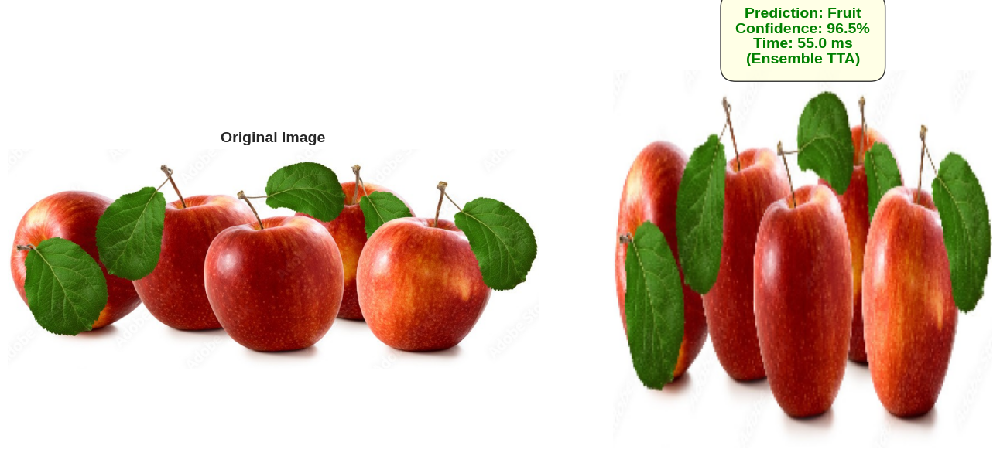

(1, 0.9653267, 0.05502629280090332)

In [ ]:
test_single_image('/kaggle/input/test-kaggle/fruit/fruit11.jpeg', model, device)


🔍 Testing: /kaggle/input/test-kaggle/fruit/fruit.jpeg

🎯 PREDICTION: Fruit
✅ Confidence: 97.22%
⏱️ Inference Time: 51.83 ms

📊 Detailed Probabilities:
   Food:  2.78%
   Fruit: 97.22%


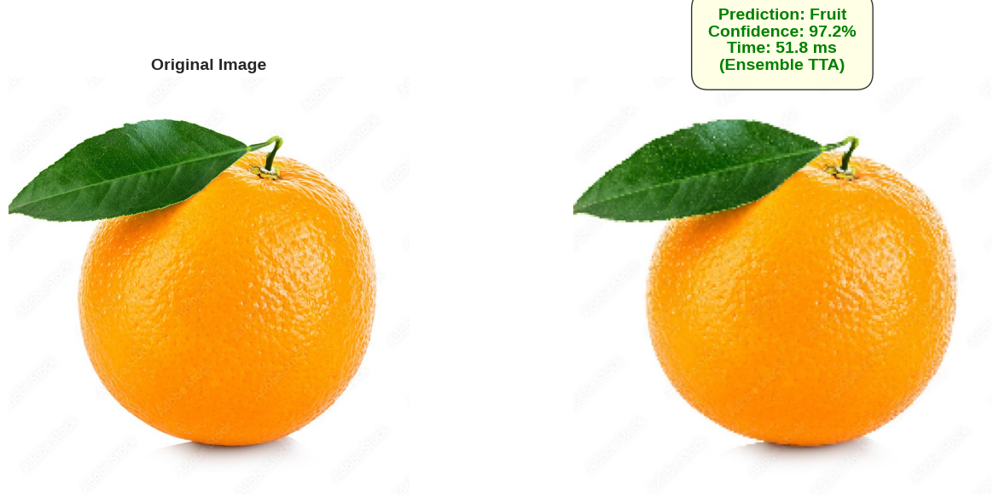

(1, 0.97220236, 0.05182504653930664)

In [ ]:
test_single_image('/kaggle/input/test-kaggle/fruit/fruit.jpeg', model, device)


🔍 Testing: /kaggle/input/test-kaggle/food/food3.jpg

🎯 PREDICTION: Food
✅ Confidence: 99.67%
⏱️ Inference Time: 54.71 ms

📊 Detailed Probabilities:
   Food:  99.67%
   Fruit: 0.33%


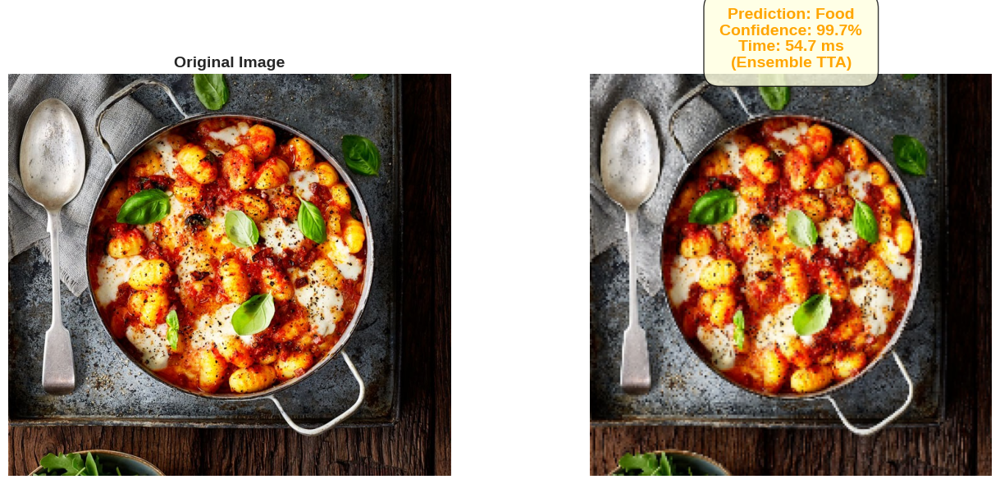

(0, 0.99668443, 0.05471062660217285)

In [ ]:
test_single_image('/kaggle/input/test-kaggle/food/food3.jpg', model, device)

# ***Prepared By Team 3***